# XGB Training Run

In [18]:
# Add this to the top of your notebook
%load_ext autoreload
%autoreload 2  
import sys
import os
script_path = os.getcwd()
crime_dir = os.path.abspath(os.path.join(script_path, ".."))
sys.path.insert(0, crime_dir)

import torch
import numpy as np
from Processing.Sample import Sample
import numpy as np
from torch.utils.data import DataLoader, TensorDataset 
import torch.nn as nn
import torch.optim as optimise
from torch.optim.lr_scheduler import StepLR
from Models.Core_CNN import Core_CNN
from Models.Core_CNN_TPL import Core_CNN_TPL
from Models.SCNN_TPL import SCNN_TPL
from Models.XGBoost import XGB_Train
from Processing.Trainer import Trainer
from hyperopt import hp, fmin, atpe, space_eval, STATUS_OK, Trials
from functools import partial
import warnings
np.warnings = warnings
warnings.filterwarnings("ignore")

import argparse

process_id = 0

print(f"Running process {process_id}")

# Define fixed parameters
prop_to_use = 1
num_epochs = 100
model_class = XGB_Train
apriori_relevance = torch.ones(801)
input_channels = 1


learning_rate = 5E-4
weight_decay = 0.1
scheduler_step_size = 10 #args['scheduler_step_size']
scheduler_gamma = 0.5 #args['scheduler_gamma']
leak_rate = 0.1
dropout_rate = 0.7
entropy_weights = torch.tensor([1,0.7137419678717736,1,1])

trainer = Trainer()
train_score = trainer.train(prop_to_use, learning_rate, weight_decay, scheduler_step_size, scheduler_gamma, num_epochs, entropy_weights, model_class, batch_size=32400, early_stop=False, training_fold_number=1, val_fold_number=1, number_of_training_folds=2, validation_test_folds=2)


# train_score = trainer.train(prop_to_use, learning_rate, weight_decay, scheduler_step_size, scheduler_gamma, num_epochs, entropy_weights, model_class, batch_size=32400, early_stop=False, fold_number=5,
#             apriori_relevance = apriori_relevance, input_channels = input_channels, leak_rate = leak_rate, dropout_rate = dropout_rate)
print(train_score)




# # define an objective function
# def objective(args):
#     learning_rate = args['learning_rate']
#     weight_decay = args['weight_decay']
#     scheduler_step_size = 10 #args['scheduler_step_size']
#     scheduler_gamma = 0.5 #args['scheduler_gamma']
#     leak_rate = args['leak_rate']
#     dropout_rate = args['dropout_rate']
#     entropy_weights = torch.tensor([args['entropy_weight_0'],args['entropy_weight_1'],args['entropy_weight_2'],args['entropy_weight_3']]).float()

#     trainer = Trainer()
#     train_score = trainer.train(prop_to_use, learning_rate, weight_decay, scheduler_step_size, scheduler_gamma, num_epochs, entropy_weights, model_class, batch_size=3600, fold_number=run_args.process_id,
#               apriori_relevance = apriori_relevance, input_channels = input_channels, leak_rate = leak_rate, dropout_rate = dropout_rate)
#     print(train_score)
#     return {"loss": train_score[0], "status": STATUS_OK}

# # define a search space
# space = {
#     "learning_rate": hp.loguniform("learning_rate", np.log(1e-6), np.log(1e-2)),
#     "weight_decay": hp.loguniform("weight_decay", np.log(1E-5), 0.2),
#     # "scheduler_step_size": hp.quniform("scheduler_step_size", 1, 50, 1),
#     # "scheduler_gamma": hp.uniform("scheduler_gamma", 0, 1),
#     "leak_rate": hp.loguniform("leak_rate", np.log(1E-2), 0.3),
#     "dropout_rate": hp.uniform("dropout_rate", 0.25, 0.9),
#     "entropy_weight_0": hp.uniform("entropy_weight_0", 0.1, 1),
#     "entropy_weight_1": hp.uniform("entropy_weight_1", 0.1, 1),
#     "entropy_weight_2": hp.uniform("entropy_weight_2", 0.1, 1),
#     "entropy_weight_3": hp.uniform("entropy_weight_3", 0.1, 1)
# }

# trials = Trials()

# algorithm = atpe.suggest

# # minimize the objective over the space
# best = fmin(objective, space, algo=algorithm, max_evals=100, trials=trials)

# print(best)
# print(space_eval(space, best))
# save_directory = "/local/scratch/Data/TROPHY/Models/"
# np.save(save_directory + "best_" + model_class.name + str(process_id), best )
# np.save(save_directory + "trials_" + model_class.name + str(process_id), trials)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Running process 0
Using device: cuda
Training Model
XGB_Train
yes
Loading data with 2 training folds and 2 testing folds
On csvm5
Loaded 90 samples
Using the specified training fold 1 and validation fold 1
Reducing to 100% of loaded data
Keeping 593720 for training
Keeping 300843 for validation
Keeping 297991 for testing
tensor([195225, 270164, 246844,  ..., 359566,  34009, 236779])
Loading data with 2 training folds and 2 testing folds
On csvm5
Loaded 90 samples
Using the specified training fold 1 and validation fold 1
Reducing to 100% of loaded data
Keeping 593720 for training
Keeping 300843 for validation
Keeping 297991 for testing
tensor([137195, 502250, 520883,  ...,  21714, 569962,  33907])
On csvm5
Fitting
593720 593720
Accuracy: [0.8   0.743 0.831 0.916]
Sensitivity: [0.581 0.815 0.272 0.586]
Specificity: [0.854 0.674 0.943 0.972]
FPR: [0.146 0.326 0.057 0.028]
Overall accuracy: 0.5635689108

# Hyperparameter Search

In [ ]:
import sys
import os
parent_dir = os.path.abspath(os.path.join(os.getcwd(), '..'))
sys.path.insert(0, parent_dir)
import torch
import numpy as np
from Sample import Sample
import numpy as np
from torch.utils.data import DataLoader, TensorDataset 
import torch.nn as nn
import torch.optim as optimise
from torch.optim.lr_scheduler import StepLR
from Core_CNN import Core_CNN
from Core_CNN_TPL import Core_CNN_TPL
from Trainer import Trainer
from hyperopt import hp, fmin, atpe, space_eval, STATUS_OK, Trials
from functools import partial
import warnings
np.warnings = warnings
warnings.filterwarnings("ignore")

# Define fixed parameters
prop_to_use = 1
num_epochs = 80
model_class = Core_CNN_TPL
apriori_relevance = torch.ones(801)
input_channels = 1

# define an objective function
def objective(args):
    learning_rate = args['learning_rate']
    weight_decay = args['weight_decay']
    scheduler_step_size = args['scheduler_step_size']
    scheduler_gamma = args['scheduler_gamma']
    leak_rate = args['leak_rate']
    dropout_rate = args['dropout_rate']
    entropy_weights = torch.tensor([args['entropy_weight_0'],args['entropy_weight_1'],args['entropy_weight_2'],args['entropy_weight_3']]).float()

    trainer = Trainer()
    train_score = trainer.train(prop_to_use, learning_rate, weight_decay, scheduler_step_size, scheduler_gamma, num_epochs, entropy_weights, model_class,
              apriori_relevance = apriori_relevance, input_channels = input_channels, leak_rate = leak_rate, dropout_rate = dropout_rate)
    print(train_score)
    return {"loss": train_score[0], "status": STATUS_OK}

# define a search space
space = {
    "learning_rate": hp.loguniform("learning_rate", np.log(1e-10), np.log(1e1)),
    "weight_decay": hp.uniform("weight_decay", 0, 0.8),
    "scheduler_step_size": hp.quniform("scheduler_step_size", 1, 50, 1),
    "scheduler_gamma": hp.uniform("scheduler_gamma", 0, 1),
    "leak_rate": hp.uniform("leak_rate", 0, 0.5),
    "dropout_rate": hp.uniform("dropout_rate", 0, 0.9),
    "entropy_weight_0": hp.uniform("entropy_weight_0", 0.1, 3),
    "entropy_weight_1": hp.uniform("entropy_weight_1", 0.1, 3),
    "entropy_weight_2": hp.uniform("entropy_weight_2", 0.1, 3),
    "entropy_weight_3": hp.uniform("entropy_weight_3", 0.1, 3)
}

trials = Trials()

algorithm = atpe.suggest

# minimize the objective over the space
best = fmin(objective, space, algo=algorithm, max_evals=250, trials=trials)

print(best)
print(space_eval(space, best))
save_directory = "/local/scratch/Data/TROPHY/Models/"
np.save(save_directory + "best_Core_CNN_TPL", best)
np.save(save_directory + "trials_Core_CNN_TPL", trials)

Using device: cuda                                   
Loaded 90 samples                                    
Training set final index: 1043928                    
Reducing to 100% of loaded data                      
Keeping 1043928 for training                         
Keeping 148626 for testing                           
Epoch 1/3 stats - learning rate: 8.78e-01            
Loss: train 0.9033258272184241, test 0.9137876862992786
Accuracy: train [0.781 0.503 0.836 0.866], test [0.933 0.504 0.853 0.719]
Sensitivity: train [0.011 0.979 0.002 0.037], test [0. 1. 0. 0.]
Specificity: train [0.99  0.034 0.999 0.987], test [1. 0. 1. 1.]
FPR: train [0.01  0.966 0.001 0.013], test [0. 1. 0. 0.]
!!New max test sensitivity score 300000.99999000004  
Skipping the rest of training, best: 300000.99999000004
(np.float64(300000.99999000004), {'train_sensitivity': array([0.011, 0.979, 0.002, 0.037]), 'train_specificity': array([0.99 , 0.034, 0.999, 0.987]), 'train_accuracy': array([0.781, 0.503, 0.836,

## Fixed Weights Trials

In [4]:
import sys
import os
parent_dir = os.path.abspath(os.path.join(os.getcwd(), '..'))
sys.path.insert(0, parent_dir)
import torch
import numpy as np
from Processing.Sample import Sample
import numpy as np
from torch.utils.data import DataLoader, TensorDataset 
import torch.nn as nn
import torch.optim as optimise
from torch.optim.lr_scheduler import StepLR
from Models.Core_CNN import Core_CNN
from Models.Core_CNN_TPL import Core_CNN_TPL
from Models.SCNN_TPL import SCNN_TPL
from Processing.Trainer import Trainer
from Processing.misc import calculate_performance_stats_by_class
from sklearn.metrics import accuracy_score

# Control parameters
run = 12
num_trials = 10
try_training = False
model_class = SCNN_TPL
apriori_relevance = torch.ones(801).to('cuda')
input_channels = 1
sensitivities = []
specificities = []
accuracies = []
fprs = []
overall_accuracies = []

best_losses = []
for i in range(num_trials):
    trials_info = np.load("/local/scratch/Data/TROPHY/Models/Run" + str(run) + "/trials_" + model_class.name + str(i) + ".npy", allow_pickle=True)
    # print(trials_info)
    # print(trials_info)
    best_loss = min([trial_info["result"]["loss"] for trial_info in trials_info])
    best_losses.append(best_loss)
    weights = np.load("/local/scratch/Data/TROPHY/Models/Run" + str(run) + "/best_" + model_class.name + str(i) + ".npy", allow_pickle=True).item()
    trainer = Trainer()
    evaluation_model = SCNN_TPL(apriori_relevance, weights['leak_rate'], weights['dropout_rate'], 1)
    # Core_CNN_TPL: "/local/scratch/Data/TROPHY/Models/5.92Core_CNN_TPL.pth"
    total_eval_confusion_matrix, predictions, true_outputs, raw_inputs = trainer.evaluate_test_data(evaluation_model, "/local/scratch/Data/TROPHY/Models/"+f"{best_loss:.6f}" + model_class.name + ".pth", 1, 4, 5120, fold_number=i)
    overall_accuracies.append(accuracy_score(true_outputs, predictions))
    sensitivity, specificity, accuracy, fpr = calculate_performance_stats_by_class(total_eval_confusion_matrix)
    sensitivities.append(sensitivity)
    specificities.append(specificity)
    accuracies.append(accuracy)
    fprs.append(fpr)




# print(best_losses)
# best_trial = np.argmin(best_losses)
# print(f"Best trial: {best_trial}")

# weights = np.load("/local/scratch/Data/TROPHY/Models/Run" + str(run) + "/best_" + model_class.name + str(best_trial) + ".npy", allow_pickle=True).item()
# print("best weights: ", weights)

if try_training:
    # Define fixed parameters
    prop_to_use = 1
    num_epochs = 50

    # Adjustable

    entropy_weights = torch.tensor([ weights['entropy_weight_0'],weights['entropy_weight_1'],weights['entropy_weight_2'],weights['entropy_weight_3']]).float()

    trials_stats = []

    for trial in range(0,3): 
        trainer = Trainer()
        best_sensitivty_score, best_stats = trainer.train(prop_to_use, weights['learning_rate'],  weights['weight_decay'],  weights['scheduler_step_size'],  weights['scheduler_gamma'], num_epochs, entropy_weights, model_class,
                    apriori_relevance = apriori_relevance, input_channels = input_channels, leak_rate = weights['leak_rate'], dropout_rate = weights['dropout_rate'])
        trials_stats.append({'sensitivity_score': best_sensitivty_score, 'stats': best_stats})
                
    # np.save("/local/scratch/Data/TROPHY/Models/trials_stats.npy", trials_stats)


Using device: cuda
On csvm5


/local/scratch/code/TROPHY/colon_data_analysis/CRIME/Processing/Trainer.py:334: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path)['m

Loaded 90 samples
Fold 0 match score: 0.0031443930500130394
Fold 1 match score: 0.00038327442349760793
Fold 2 match score: 0.002317961890830047
Fold 3 match score: 0.032025968040839195
Fold 4 match score: 0.001344678325095533
Fold 5 match score: 0.0039146170771726585
Fold 6 match score: 0.001329145637050077
Fold 7 match score: 0.01411717452142827
Fold 8 match score: 0.00496805675420928
Fold 9 match score: 0.0011310808181309064
Reducing to 100% of loaded data
Keeping 1081303 for training
Keeping 111251 for testing
Using device: cuda
On csvm5


/local/scratch/code/TROPHY/colon_data_analysis/CRIME/Processing/Trainer.py:334: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path)['m

Loaded 90 samples
Fold 0 match score: 0.0031443930500130394
Fold 1 match score: 0.00038327442349760793
Fold 2 match score: 0.002317961890830047
Fold 3 match score: 0.032025968040839195
Fold 4 match score: 0.001344678325095533
Fold 5 match score: 0.0039146170771726585
Fold 6 match score: 0.001329145637050077
Fold 7 match score: 0.01411717452142827
Fold 8 match score: 0.00496805675420928
Fold 9 match score: 0.0011310808181309064
Reducing to 100% of loaded data
Keeping 1079315 for training
Keeping 113239 for testing
Using device: cuda
On csvm5


/local/scratch/code/TROPHY/colon_data_analysis/CRIME/Processing/Trainer.py:334: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path)['m

Loaded 90 samples
Fold 0 match score: 0.0031443930500130394
Fold 1 match score: 0.00038327442349760793
Fold 2 match score: 0.002317961890830047
Fold 3 match score: 0.032025968040839195
Fold 4 match score: 0.001344678325095533
Fold 5 match score: 0.0039146170771726585
Fold 6 match score: 0.001329145637050077
Fold 7 match score: 0.01411717452142827
Fold 8 match score: 0.00496805675420928
Fold 9 match score: 0.0011310808181309064
Reducing to 100% of loaded data
Keeping 1078696 for training
Keeping 113858 for testing
Using device: cuda
On csvm5


/local/scratch/code/TROPHY/colon_data_analysis/CRIME/Processing/Trainer.py:334: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path)['m

Loaded 90 samples
Fold 0 match score: 0.0031443930500130394
Fold 1 match score: 0.00038327442349760793
Fold 2 match score: 0.002317961890830047
Fold 3 match score: 0.032025968040839195
Fold 4 match score: 0.001344678325095533
Fold 5 match score: 0.0039146170771726585
Fold 6 match score: 0.001329145637050077
Fold 7 match score: 0.01411717452142827
Fold 8 match score: 0.00496805675420928
Fold 9 match score: 0.0011310808181309064
Reducing to 100% of loaded data
Keeping 1053396 for training
Keeping 139158 for testing
Using device: cuda
On csvm5


/local/scratch/code/TROPHY/colon_data_analysis/CRIME/Processing/Trainer.py:334: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path)['m

Loaded 90 samples
Fold 0 match score: 0.0031443930500130394
Fold 1 match score: 0.00038327442349760793
Fold 2 match score: 0.002317961890830047
Fold 3 match score: 0.032025968040839195
Fold 4 match score: 0.001344678325095533
Fold 5 match score: 0.0039146170771726585
Fold 6 match score: 0.001329145637050077
Fold 7 match score: 0.01411717452142827
Fold 8 match score: 0.00496805675420928
Fold 9 match score: 0.0011310808181309064
Reducing to 100% of loaded data
Keeping 1074498 for training
Keeping 118056 for testing
Using device: cuda
On csvm5


/local/scratch/code/TROPHY/colon_data_analysis/CRIME/Processing/Trainer.py:334: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path)['m

Loaded 90 samples
Fold 0 match score: 0.0031443930500130394
Fold 1 match score: 0.00038327442349760793
Fold 2 match score: 0.002317961890830047
Fold 3 match score: 0.032025968040839195
Fold 4 match score: 0.001344678325095533
Fold 5 match score: 0.0039146170771726585
Fold 6 match score: 0.001329145637050077
Fold 7 match score: 0.01411717452142827
Fold 8 match score: 0.00496805675420928
Fold 9 match score: 0.0011310808181309064
Reducing to 100% of loaded data
Keeping 1075675 for training
Keeping 116879 for testing
Using device: cuda
On csvm5


/local/scratch/code/TROPHY/colon_data_analysis/CRIME/Processing/Trainer.py:334: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path)['m

Loaded 90 samples
Fold 0 match score: 0.0031443930500130394
Fold 1 match score: 0.00038327442349760793
Fold 2 match score: 0.002317961890830047
Fold 3 match score: 0.032025968040839195
Fold 4 match score: 0.001344678325095533
Fold 5 match score: 0.0039146170771726585
Fold 6 match score: 0.001329145637050077
Fold 7 match score: 0.01411717452142827
Fold 8 match score: 0.00496805675420928
Fold 9 match score: 0.0011310808181309064
Reducing to 100% of loaded data
Keeping 1069230 for training
Keeping 123324 for testing
Using device: cuda
On csvm5


/local/scratch/code/TROPHY/colon_data_analysis/CRIME/Processing/Trainer.py:334: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path)['m

Loaded 90 samples
Fold 0 match score: 0.0031443930500130394
Fold 1 match score: 0.00038327442349760793
Fold 2 match score: 0.002317961890830047
Fold 3 match score: 0.032025968040839195
Fold 4 match score: 0.001344678325095533
Fold 5 match score: 0.0039146170771726585
Fold 6 match score: 0.001329145637050077
Fold 7 match score: 0.01411717452142827
Fold 8 match score: 0.00496805675420928
Fold 9 match score: 0.0011310808181309064
Reducing to 100% of loaded data
Keeping 1066364 for training
Keeping 126190 for testing
Using device: cuda
On csvm5


/local/scratch/code/TROPHY/colon_data_analysis/CRIME/Processing/Trainer.py:334: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path)['m

Loaded 90 samples
Fold 0 match score: 0.0031443930500130394
Fold 1 match score: 0.00038327442349760793
Fold 2 match score: 0.002317961890830047
Fold 3 match score: 0.032025968040839195
Fold 4 match score: 0.001344678325095533
Fold 5 match score: 0.0039146170771726585
Fold 6 match score: 0.001329145637050077
Fold 7 match score: 0.01411717452142827
Fold 8 match score: 0.00496805675420928
Fold 9 match score: 0.0011310808181309064
Reducing to 100% of loaded data
Keeping 1083483 for training
Keeping 109071 for testing
Using device: cuda
On csvm5


/local/scratch/code/TROPHY/colon_data_analysis/CRIME/Processing/Trainer.py:334: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path)['m

Loaded 90 samples
Fold 0 match score: 0.0031443930500130394
Fold 1 match score: 0.00038327442349760793
Fold 2 match score: 0.002317961890830047
Fold 3 match score: 0.032025968040839195
Fold 4 match score: 0.001344678325095533
Fold 5 match score: 0.0039146170771726585
Fold 6 match score: 0.001329145637050077
Fold 7 match score: 0.01411717452142827
Fold 8 match score: 0.00496805675420928
Fold 9 match score: 0.0011310808181309064
Reducing to 100% of loaded data
Keeping 1071026 for training
Keeping 121528 for testing


In [5]:
print(sensitivities)
print(f"Mean overall accuracy: {np.mean(overall_accuracies)}")
print(f"Standard deviation overall accuracy: {np.std(overall_accuracies)}")
print(f"Mean sensitivity: {np.mean(sensitivities, axis=0)}")
print(f"Standard deviation sensitivity: {np.std(sensitivities, axis=0)}")
print(f"Mean specificity: {np.mean(specificities, axis=0)}")
print(f"Standard deviation specificity: {np.std(specificities, axis=0)}")

[array([0.768, 0.343, 0.767, 0.626]), array([0.67 , 0.755, 0.765, 0.824]), array([0.73 , 0.958, 0.263, 0.7  ]), array([0.474, 0.843, 0.378, 0.833]), array([0.687, 0.859, 0.435, 0.859]), array([0.725, 0.415, 0.575, 0.501]), array([0.749, 0.6  , 0.59 , 0.814]), array([0.422, 0.65 , 0.609, 0.559]), array([0.833, 0.858, 0.668, 0.953]), array([0.626, 0.707, 0.373, 0.682])]
Mean overall accuracy: 0.6745741114412764
Standard deviation overall accuracy: 0.10211768946200946
Mean sensitivity: [0.6684 0.6988 0.5423 0.7351]
Standard deviation sensitivity: [0.12294649 0.19012932 0.16396893 0.13722715]
Mean specificity: [0.8853 0.8606 0.8956 0.9141]
Standard deviation specificity: [0.0480688  0.07555687 0.08882927 0.1034857 ]


## Model Predictions

In [5]:
import sys
import os
parent_dir = os.path.abspath(os.path.join(os.getcwd(), '..'))
sys.path.insert(0, parent_dir)
import torch
import numpy as np
from Processing.Sample import Sample
import numpy as np
from torch.utils.data import DataLoader, TensorDataset 
import torch.nn as nn
import torch.optim as optimise
from torch.optim.lr_scheduler import StepLR
from Models.Core_CNN import Core_CNN
from Models.Core_CNN_TPL import Core_CNN_TPL
from Models.SCNN_TPL import SCNN_TPL
from Processing.Trainer import Trainer
import matplotlib.pyplot as plt

trainer = Trainer()
evaluation_model = SCNN_TPL(apriori_relevance, weights['leak_rate'], weights['dropout_rate'], 1)
# Core_CNN_TPL: "/local/scratch/Data/TROPHY/Models/5.92Core_CNN_TPL.pth"
total_eval_confusion_matrix, predictions, true_outputs, raw_inputs = trainer.evaluate_test_data(evaluation_model, "/local/scratch/Data/TROPHY/Models/5.328381SCNN_TPL.pth", 1, 4, 5120)
print(total_eval_confusion_matrix)

# true_outputs_hist = np.histogram(true_outputs, bins = [0,1,2,3])


Using device: cuda


/local/scratch/code/TROPHY/colon_data_analysis/CRIME/Processing/Trainer.py:276: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path)['m

Loaded 90 samples
Fold 0 match score: 0.0031443930500130394
Fold 1 match score: 0.00038327442349760793
Fold 2 match score: 0.002317961890830047
Fold 3 match score: 0.032025968040839195
Fold 4 match score: 0.001344678325095533
Fold 5 match score: 0.0039146170771726585
Fold 6 match score: 0.001329145637050077
Fold 7 match score: 0.01411717452142827
Fold 8 match score: 0.00496805675420928
Fold 9 match score: 0.0011310808181309064
Best fold: 1
Reducing to 100% of loaded data
Keeping 1079315 for training
Keeping 113239 for testing
[[1.4703e+04 6.1380e+03 1.6900e+03 1.2200e+02]
 [5.8530e+03 4.2780e+04 6.6690e+03 7.6200e+02]
 [1.1300e+02 8.6400e+02 1.2185e+04 3.6510e+03]
 [2.4500e+02 1.3330e+03 2.0000e+00 1.6129e+04]]


In [8]:
from Processing.misc import calculate_performance_stats_by_class
sensitivity, specificity, accuracy, fpr = calculate_performance_stats_by_class(total_eval_confusion_matrix)
print(sensitivity, specificity, accuracy, fpr)

[0.649 0.763 0.725 0.911] [0.931 0.854 0.913 0.953] [0.875 0.809 0.885 0.946] [0.069 0.146 0.087 0.047]


In [3]:
import sys
import os
parent_dir = os.path.abspath(os.path.join(os.getcwd(), '..'))
sys.path.insert(0, parent_dir)
import torch
import numpy as np
from Processing.Sample import Sample
import numpy as np
from torch.utils.data import DataLoader, TensorDataset 
import torch.nn as nn
import torch.optim as optimise
from torch.optim.lr_scheduler import StepLR
from Models.Core_CNN import Core_CNN
from Models.Core_CNN_TPL import Core_CNN_TPL
from Processing.Trainer import Trainer
import matplotlib.pyplot as plt

trainer = Trainer()

train_loader, test_loader, train_size, test_size = trainer.load_data(1, batch_size = 1000000)
train_xs = np.empty((0, 801))
train_ys = np.empty((0))
test_xs = np.empty((0, 801))
test_ys = np.empty((0))
i = 0
for xs, ys in train_loader:
    train_xs = np.concat([train_xs, xs])
    train_ys = np.concat([train_ys, ys])
    print(i)
    i += 1
    print(train_xs.shape)
    # print(ys)
for xs, ys in test_loader:
    test_xs = np.concat([test_xs, xs])
    test_ys = np.concat([test_ys, ys])



Using device: cuda
Loaded 90 samples
Training set final index: 1043928
Reducing to 100% of loaded data
Keeping 1043928 for training
Keeping 148626 for testing
0
(1000000, 801)
1
(1043928, 801)


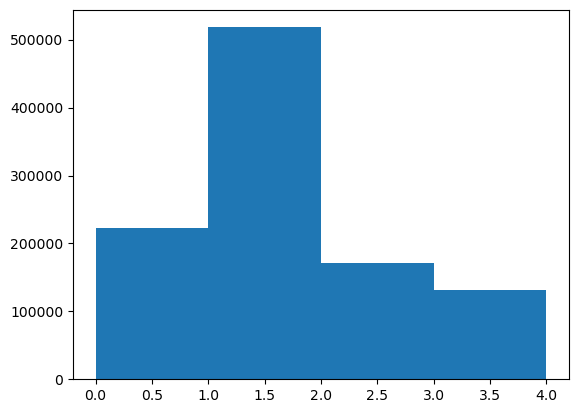

(1043928,)
(148626,)


In [16]:
plt.hist(train_ys, bins = [0,1,2,3,4])
plt.show()
print(np.shape(train_ys))
print(np.shape(test_ys))

In [4]:
save_directory = "/local/scratch/Data/TROPHY/numpy/"
from Processing.Sample import Sample
import matplotlib.pyplot as plt
import numpy as np
samples = np.load(save_directory + "samples.npy", allow_pickle = True)
# coords = np.load(save_directory + "coords.npy")
data = np.load(save_directory + "data.npy")
classification = np.load(save_directory + "classification.npy")
print(samples[0].layer_range)

s0_tests = samples[0].calculate_tests(data)
print(np.shape(s0_tests[0]))
s0_answers = samples[0].calculate_answers(classification)
print(s0_answers)

[range(0, 2445), range(2446, 3348), range(3349, 4466)]
(4466, 801)
(801,)
[3 3 3 ... 3 3 3]


In [ ]:
print(np.shape(data.T))
groups = []
for i, sample in enumerate(samples):
    sample_size = sample.end_index - sample.start_index + 1
    indices = np.ones(sample_size) * i
    groups = np.concatenate([groups, indices])


from sklearn.model_selection import StratifiedGroupKFold
skf = StratifiedGroupKFold(n_splits = 10)
training_indices = []
test_indices = []
for train, test in skf.split(np.transpose(data), classification, groups):
    training_indices.append(train)
    test_indices.append(test)
    print(len(train))
    print(len(test))





(1192554, 801)
1081303
111251
1079315
113239
1078696
113858
1053396
139158
1074498
118056
1075675
116879
1069230
123324
1066364
126190
1083483
109071
1071026
121528


1081303


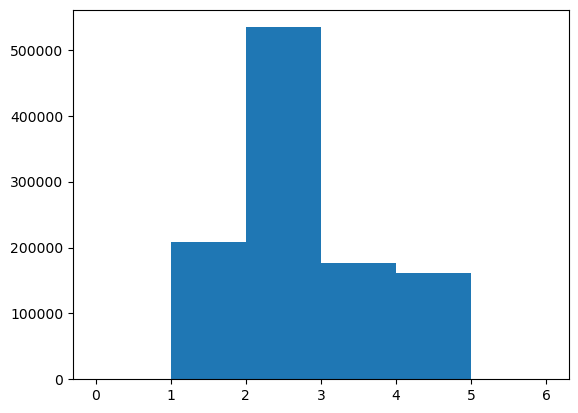

111251


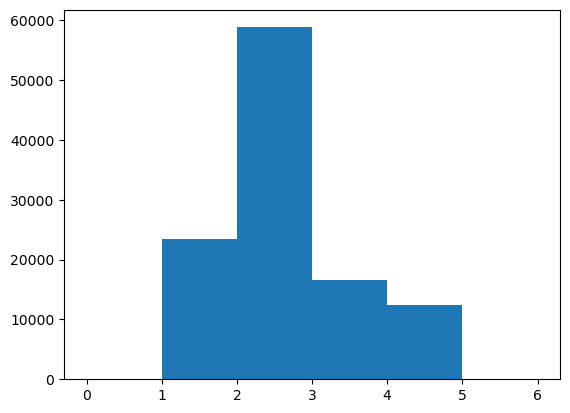

In [46]:
print(len(training_indices[0]))
training_real_ys = classification[training_indices[0]]
plt.hist(training_real_ys, bins = [0,1,2,3,4,5,6])
plt.show()
print(len(test_indices[0]))
testing_real_ys = classification[test_indices[0]]
plt.hist(testing_real_ys, bins = [0,1,2,3,4,5,6])
plt.show()

In [1]:
%load_ext autoreload
%autoreload 2

# ViT Runs

In [1]:

import sys
import os
parent_dir = os.path.abspath(os.path.join(os.getcwd(), '..'))
sys.path.insert(0, parent_dir)
import torch
import numpy as np
from Processing.Sample import Sample
import numpy as np
from torch.utils.data import DataLoader, TensorDataset 
import torch.nn as nn
import torch.optim as optimise
from torch.optim.lr_scheduler import StepLR
from Models.Core_CNN import Core_CNN
from Models.Core_CNN_TPL import Core_CNN_TPL
from Models.ViT import ViT
from Processing.Trainer import Trainer
import matplotlib.pyplot as plt

trainer = Trainer()

trainer.train(1, 0.0001, 0.0001, 10, 0.1, 50, torch.tensor([1,1,1,1]).float(), ViT, input_channels = 1, input_length = 801, embed_kernel_size = 10, embed_stride = 1, embedding_dims = 80, leak_rate = 0.1, dropout_rate = 0.1)

/local/scratch/code/TROPHY/colon_data_analysis/CRIME
Using device: cuda
Loaded 90 samples
Fold 0 match score: 0.0031443930500130394
Fold 1 match score: 0.00038327442349760793
Fold 2 match score: 0.002317961890830047
Fold 3 match score: 0.032025968040839195
Fold 4 match score: 0.001344678325095533
Fold 5 match score: 0.0039146170771726585
Fold 6 match score: 0.001329145637050077
Fold 7 match score: 0.01411717452142827
Fold 8 match score: 0.00496805675420928
Fold 9 match score: 0.0011310808181309064
Best fold: 1
Reducing to 100% of loaded data
Keeping 1079315 for training
Keeping 113239 for testing
1
torch.Size([512, 1, 801])
torch.Size([512, 801])
torch.Size([512, 792, 10])
torch.Size([512, 792, 80])


ValueError: Classification metrics can't handle a mix of multiclass and multiclass-multioutput targets

# SCNN-TPL2 Train

In [1]:
import sys
import os
script_path = os.getcwd()
crime_dir = os.path.abspath(os.path.join(script_path, ".."))
sys.path.insert(0, crime_dir)

import torch
import numpy as np
from Processing.Sample import Sample
import numpy as np
from torch.utils.data import DataLoader, TensorDataset 
import torch.nn as nn
import torch.optim as optimise
from torch.optim.lr_scheduler import StepLR
from Models.Core_CNN import Core_CNN
from Models.Core_CNN_TPL import Core_CNN_TPL
from Models.Core_CNN_TPL2 import Core_CNN_TPL2
from Models.SCNN_TPL2 import SCNN_TPL2
from Models.SCNN_TPL3 import SCNN_TPL3
from Models.SCNN_TPL import SCNN_TPL
from Models.XGBoost import XGB_Train
from Processing.Trainer import Trainer
from hyperopt import hp, fmin, atpe, space_eval, STATUS_OK, Trials
from functools import partial
import warnings
np.warnings = warnings
warnings.filterwarnings("ignore")

import argparse

process_id = -1

print(f"Running process {process_id}")

# Define fixed parameters
prop_to_use = 0.05
number_of_training_folds = 3
validation_test_folds = 2
training_fold_number = -1
test_fold_number = 1
num_epochs = 10
model_class = SCNN_TPL3
apriori_relevance = torch.ones(801)
input_channels = 1
batch_size = 2048
early_stop = False




learning_rate = 5E-4
weight_decay = 0.1
scheduler_step_size = 10 #args['scheduler_step_size']
scheduler_gamma = 0.5 #args['scheduler_gamma']
leak_rate = 0.1
dropout_rate = 0.7
entropy_weights = torch.tensor([1,0.7137419678717736,1,1])

trainer = Trainer()
train_score = trainer.train(prop_to_use, learning_rate, weight_decay, scheduler_step_size, scheduler_gamma, num_epochs, entropy_weights, model_class, batch_size=batch_size, early_stop=early_stop, training_fold_number=training_fold_number, test_fold_number=test_fold_number, number_of_training_folds=number_of_training_folds, validation_test_folds=validation_test_folds, apriori_relevance=apriori_relevance, input_channels=input_channels, leak_rate=leak_rate, dropout_rate=dropout_rate)


# train_score = trainer.train(prop_to_use, learning_rate, weight_decay, scheduler_step_size, scheduler_gamma, num_epochs, entropy_weights, model_class, batch_size=32400, early_stop=False, fold_number=5,
#             apriori_relevance = apriori_relevance, input_channels = input_channels, leak_rate = leak_rate, dropout_rate = dropout_rate)
print(train_score)




# # define an objective function
# def objective(args):
#     learning_rate = args['learning_rate']
#     weight_decay = args['weight_decay']
#     scheduler_step_size = 10 #args['scheduler_step_size']
#     scheduler_gamma = 0.5 #args['scheduler_gamma']
#     leak_rate = args['leak_rate']
#     dropout_rate = args['dropout_rate']
#     entropy_weights = torch.tensor([args['entropy_weight_0'],args['entropy_weight_1'],args['entropy_weight_2'],args['entropy_weight_3']]).float()

#     trainer = Trainer()
#     train_score = trainer.train(prop_to_use, learning_rate, weight_decay, scheduler_step_size, scheduler_gamma, num_epochs, entropy_weights, model_class, batch_size=3600, fold_number=run_args.process_id,
#               apriori_relevance = apriori_relevance, input_channels = input_channels, leak_rate = leak_rate, dropout_rate = dropout_rate)
#     print(train_score)
#     return {"loss": train_score[0], "status": STATUS_OK}

# # define a search space
# space = {
#     "learning_rate": hp.loguniform("learning_rate", np.log(1e-6), np.log(1e-2)),
#     "weight_decay": hp.loguniform("weight_decay", np.log(1E-5), 0.2),
#     # "scheduler_step_size": hp.quniform("scheduler_step_size", 1, 50, 1),
#     # "scheduler_gamma": hp.uniform("scheduler_gamma", 0, 1),
#     "leak_rate": hp.loguniform("leak_rate", np.log(1E-2), 0.3),
#     "dropout_rate": hp.uniform("dropout_rate", 0.25, 0.9),
#     "entropy_weight_0": hp.uniform("entropy_weight_0", 0.1, 1),
#     "entropy_weight_1": hp.uniform("entropy_weight_1", 0.1, 1),
#     "entropy_weight_2": hp.uniform("entropy_weight_2", 0.1, 1),
#     "entropy_weight_3": hp.uniform("entropy_weight_3", 0.1, 1)
# }

# trials = Trials()

# algorithm = atpe.suggest

# # minimize the objective over the space
# best = fmin(objective, space, algo=algorithm, max_evals=100, trials=trials)

# print(best)
# print(space_eval(space, best))
# save_directory = "/local/scratch/Data/TROPHY/Models/"
# np.save(save_directory + "best_" + model_class.name + str(process_id), best )
# np.save(save_directory + "trials_" + model_class.name + str(process_id), trials)

/local/scratch/code/TROPHY/colon_data_analysis/CRIME


/home/tjh200/miniconda3/envs/ml_env/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Running process -1
Using device: cuda
Training Model
SCNN_TPL3
Loading data with 3 training folds and 2 testing folds
On csvm5
Loaded 90 samples
Training fold 0, validation fold 0 match score: 0.00010006380719261212
Training fold 0, validation fold 1 match score: 4.562244630979301e-06
Training fold 1, validation fold 0 match score: 0.002447667727575116
Training fold 1, validation fold 1 match score: 0.0027761275785256247
Training fold 2, validation fold 0 match score: 0.00014607713673903252
Training fold 2, validation fold 1 match score: 0.00019777775453719328
Using best match with training fold 0 and validation fold 1
Reducing to 5.0% of loaded data
Keeping 39991 for training
Keeping 9893 for validation
Keeping 9742 for testing
tensor([ 28651, 513387,  88163,  ..., 263304, 621016, 177433])


wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: tjh200 (tjh200-university-of-cambridge) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


Epoch 1/10 stats - learning rate: 5.00e-04
Loss: train 1.3922889985134637, val 1.38381538065285, test 1.3826467097845687
Accuracy: train [0.784 0.503 0.761 0.409], val [0.803 0.507 0.837 0.147], test [0.809 0.506 0.838 0.152]
Sensitivity: train [0.031 0.23  0.106 0.633], val [0. 0. 0. 1.], test [0. 0. 0. 1.]
Specificity: train [0.97  0.77  0.887 0.372], val [1. 1. 1. 0.], test [1. 1. 1. 0.]
FPR: train [0.03  0.23  0.113 0.628], val [0. 0. 0. 1.], test [0. 0. 0. 1.]
!!!New max val loss score 1.38381538065285, corresponding test sensitivity score 1.3826467097845687
Params:  74866
Epoch 2/10 stats - learning rate: 5.00e-04
Loss: train 1.3873963099243087, val 1.3684351684518643, test 1.3698983399977163
Accuracy: train [0.784 0.502 0.774 0.458], val [0.802 0.493 0.837 0.853], test [0.809 0.494 0.838 0.848]
Sensitivity: train [0.035 0.317 0.087 0.559], val [0. 1. 0. 0.], test [0. 1. 0. 0.]
Specificity: train [0.969 0.684 0.907 0.44 ], val [1. 0. 1. 1.], test [1. 0. 1. 1.]
FPR: train [0.031 0

epoch,▁▂▃▃▄▅▆▆▇█
learning_rate,█████████▁
test_accuracy_0,██▁███████
test_accuracy_1,█▇▁▇▇▇▇▇▇▇
test_accuracy_2,▁▁▁▁▁▁▁▁▁▁
test_accuracy_3,▁█████████
test_fpr_0,▁▁█▁▁▁▁▁▁▁
test_fpr_1,▁█▆███████
test_fpr_2,▁▁▁▁▁▁▁▁▁▁
test_fpr_3,█▁▁▁▁▁▁▁▁▁
test_loss,█▆▆▄▃▂▂▁▁▁


Removed best model
(1.3223128513030404, {'train_sensitivity': array([0.   , 0.867, 0.   , 0.134]), 'train_specificity': array([1.   , 0.131, 1.   , 0.869]), 'train_accuracy': array([0.802, 0.496, 0.838, 0.763]), 'train_fpr': array([0.   , 0.869, 0.   , 0.131]), 'val_sensitivity': array([0., 1., 0., 0.]), 'val_specificity': array([1., 0., 1., 1.]), 'val_accuracy': array([0.803, 0.493, 0.837, 0.853]), 'val_fpr': array([0., 1., 0., 0.])})


Using device: cuda
Loading data with 2 training folds and 2 testing folds
On csvm5
Loaded 90 samples
Using the specified training fold 0 and validation fold 0
Reducing to 100% of loaded data
Keeping 598834 for training
Keeping 300960 for validation
Keeping 292760 for testing
torch.Size([598834, 801])
torch.Size([300960, 801])
torch.Size([292760, 801])


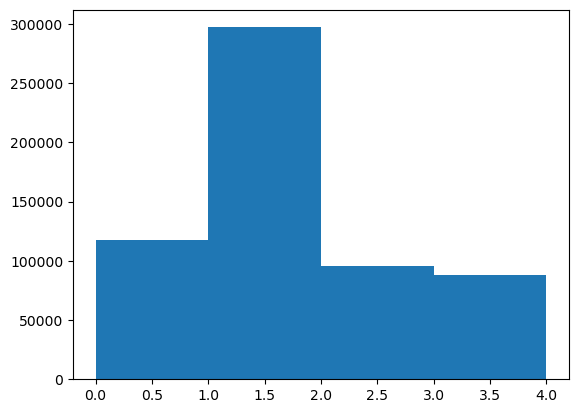

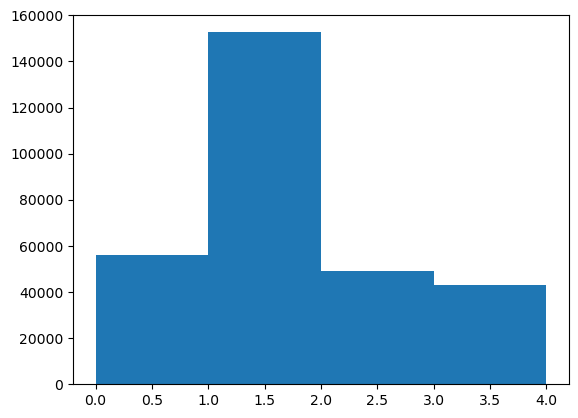

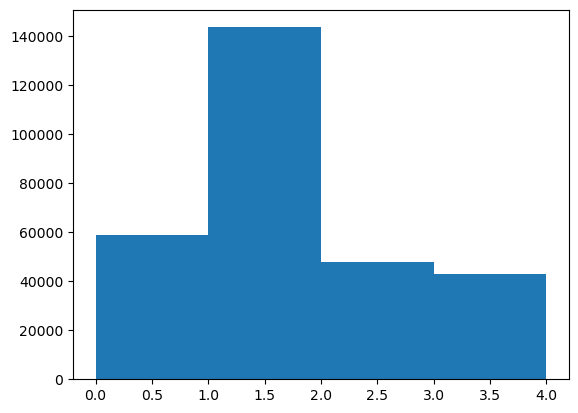

In [27]:
import sys
import os
script_path = os.getcwd()
crime_dir = os.path.abspath(os.path.join(script_path, ".."))
sys.path.insert(0, crime_dir)

import torch
import numpy as np
from Processing.Sample import Sample
import numpy as np
from torch.utils.data import DataLoader, TensorDataset 
import torch.nn as nn
import torch.optim as optimise
from torch.optim.lr_scheduler import StepLR
from Models.Core_CNN import Core_CNN
from Models.Core_CNN_TPL import Core_CNN_TPL
from Models.SCNN_TPL import SCNN_TPL
from Models.XGBoost import XGB_Train
from Processing.Trainer import Trainer
from hyperopt import hp, fmin, atpe, space_eval, STATUS_OK, Trials
from functools import partial
import matplotlib.pyplot as plt
import warnings
np.warnings = warnings
warnings.filterwarnings("ignore")

trainer = Trainer()
train_data, train_classes, val_data, val_classes, test_data, test_classes = trainer.load_data(1, batch_size=2048, number_of_training_folds=2, validation_test_folds=2, training_fold_number=0, val_fold_number=0, return_loaders =False)
print(np.shape(train_data))
print(np.shape(val_data))
print(np.shape(test_data))
plt.hist(train_classes, bins = [0,1,2,3,4])
plt.show()
plt.hist(val_classes, bins = [0,1,2,3,4])
plt.show()
plt.hist(test_classes, bins = [0,1,2,3,4])
plt.show()


In [1]:
def get_best_model_from_sweep(sweep_id, mode="best_ever", metric_name="val_sensitivity_score", 
                              minimize=True, entity="tjh200-university-of-cambridge", 
                              project="TROPHY", specific_artifact_version=None):
    """
    Retrieve the best model from a wandb sweep based on specified mode.
    
    Args:
        sweep_id (str): The ID of the sweep.
        mode (str): Either "best_ever" or "final_epoch".
        metric_name (str): The metric name to optimize.
        minimize (bool): True if lower metric values are better, False if higher are better.
        entity (str): The wandb entity name.
        project (str): The wandb project name.
        specific_artifact_version (str, optional): Specific artifact version to use.
        
    Returns:
        dict: A result object with paths to saved model and config.
    """
    import wandb
    import os
    import json
    
    # Initialize API
    api = wandb.Api()
    
    # Get all runs from the sweep
    sweep = api.sweep(f"{entity}/{project}/{sweep_id}")
    runs = sweep.runs
    
    print(f"Analyzing {len(runs)} runs in mode: {mode}...")
    
    best_run = None
    best_epoch = None
    best_value = float('inf') if minimize else float('-inf')
    
    for run in runs:
        # Skip failed runs
        if run.state != "finished":
            continue
            
        if mode == "best_ever":
            # First check if there's a pre-computed best metric in the summary
            best_metric_name = f"best_{metric_name}"
            print(f"Checking for {best_metric_name} in run: {run.name}")
            best_metric_value = run.summary.get(best_metric_name)
            
            if best_metric_value is not None:
                # If we have a pre-computed best value, use it
                print(f"Found pre-computed {best_metric_name}: {best_metric_value} for run: {run.name}")
                
                is_better = (best_metric_value < best_value) if minimize else (best_metric_value > best_value)
                if is_better:
                    best_value = best_metric_value
                    best_run = run
                    # Try to get the corresponding best epoch if available
                    best_epoch_name = f"best_epoch_{metric_name}"
                    best_epoch = run.summary.get(best_epoch_name, -1)
            else:
                # Fall back to scanning through all epochs
                # print(f"Scanning all epochs for run: {run.name}")
                
                history = run.scan_history(keys=[metric_name, "epoch"])
                
                for row in history:
                    if metric_name in row and "epoch" in row:
                        epoch = row["epoch"]
                        value = row[metric_name]
                        
                        is_better = (value < best_value) if minimize else (value > best_value)
                        if is_better:
                            best_value = value
                            best_run = run
                            best_epoch = epoch
                        
        elif mode == "final_epoch":
            # For final_epoch mode, get only the final metric
            # print(f"Checking final metrics for run: {run.name}")
            
            # Method 1: Try to get value from summary
            final_value = run.summary.get(metric_name)
            
            # Method 2: If not in summary, get the last epoch's value from history
            if final_value is None:
                history = list(run.scan_history(keys=[metric_name, "epoch"]))
                if history:
                    # Sort by epoch to ensure we get the last one
                    history.sort(key=lambda x: x.get("epoch", 0) if "epoch" in x else 0)
                    last_entry = history[-1]
                    if metric_name in last_entry:
                        final_value = last_entry[metric_name]
                        final_epoch = last_entry.get("epoch", -1)
            
            # Skip if we couldn't find the metric
            if final_value is None:
                print(f"  Could not find {metric_name} for run {run.name}")
                continue
                
            # print(f"  Final {metric_name}: {final_value}")
            
            # Check if this run is better
            is_better = (final_value < best_value) if minimize else (final_value > best_value)
            if is_better:
                best_value = final_value
                best_run = run
                best_epoch = final_epoch if 'final_epoch' in locals() else -1
    
    if best_run:
        print(f"\nBest run: {best_run.name}")
        if mode == "best_ever":
            print(f"Best epoch: {best_epoch}")
        print(f"Best {metric_name}: {best_value}")
        
        run_id = best_run.id
        
        # Create parent directory for all best models
        parent_dir = "./best_models"
        os.makedirs(parent_dir, exist_ok=True)
        
        # Format the metric value to make it filesystem-friendly
        formatted_value = f"{best_value:.4f}".replace('-', 'neg')
        
        # Create a dedicated directory for this specific model and config
        prefix = "best_model" if mode == "best_ever" else "final_model"
        model_dir_name = f"{prefix}_{sweep_id}_{run_id}_{metric_name}_{formatted_value}"
        save_dir = os.path.join(parent_dir, model_dir_name)
        os.makedirs(save_dir, exist_ok=True)
        
        try:
            # List available artifacts to verify
            print("\nAvailable artifacts:")
            for artifact in best_run.logged_artifacts():
                print(f"- {artifact.name} (type: {artifact.type})")
            
            # Choose the artifact based on mode
            artifact_type = "best-model" if mode == "best_ever" else "final-model"
            
            # Find matching artifact
            target_artifact = None
            for artifact in best_run.logged_artifacts():
                if artifact.type == "model" and artifact_type in artifact.name:
                    target_artifact = artifact
                    break
            
            if target_artifact:
                # Use the specified version if provided, otherwise use what we found
                if specific_artifact_version:
                    artifact_name = f"{entity}/{project}/{artifact_type}:{specific_artifact_version}"
                else:
                    artifact_name = f"{entity}/{project}/{target_artifact.name}"
                    
                print(f"Fetching artifact: {artifact_name}")
                model_artifact = api.artifact(artifact_name)
                
                # Download model to the dedicated directory
                model_dir = model_artifact.download(root=save_dir)
                print(f"Model downloaded to: {model_dir}")
                
                # Find the model file in the directory
                model_files = [f for f in os.listdir(model_dir) if f.endswith('.pth')]
                if model_files:
                    model_path = os.path.join(model_dir, model_files[0])
                    print(f"Model file path: {model_path}")
                else:
                    print(f"No .pth files found in {model_dir}")
                    print("Files in directory:", os.listdir(model_dir))
                
                # Get run configuration
                config = best_run.config
                config_path = os.path.join(save_dir, "config.json")
                
                # Add additional metadata
                config_with_metadata = {
                    "model_config": config,
                    "run_metadata": {
                        "run_id": run_id,
                        "run_name": best_run.name,
                        "mode": mode,
                        "best_epoch" if mode == "best_ever" else "final_epoch": best_epoch,
                        f"{metric_name}": best_value,
                        "sweep_id": sweep_id,
                        "project": project,
                        "entity": entity
                    }
                }
                
                # Save to JSON file
                with open(config_path, 'w') as f:
                    json.dump(config_with_metadata, f, indent=2)
                
                print(f"Config saved to: {config_path}")
                print(f"\nModel and config successfully saved to: {save_dir}")
                
                # Return paths for easy access
                result = {
                    "model_path": model_path,
                    "config_path": config_path,
                    "config": config_with_metadata,
                    "save_directory": save_dir,
                    "run_id": run_id,
                    "sweep_id": sweep_id,
                    "best_value": best_value,
                    "best_epoch" if mode == "best_ever" else "final_epoch": best_epoch
                }
                
                print("\nResult object:")
                for k, v in result.items():
                    print(f"  {k}: {v}")
                    
                return result
                    
            else:
                print(f"No {artifact_type} artifact found!")
                
        except Exception as e:
            print(f"Error retrieving model artifact: {e}")
            
            # Fall back to checking for direct files
            print("Checking for direct model files instead...")
            model_files = [f for f in best_run.files() if f.name.endswith('.pth')]
            if model_files:
                # Download to our organized directory
                best_model_file = model_files[0].download(root=save_dir)
                print(f"Downloaded direct model file: {best_model_file.name}")
                
                # Still save the config
                config = best_run.config
                config_path = os.path.join(save_dir, "config.json")
                with open(config_path, 'w') as f:
                    json.dump(config, f, indent=2)
                print(f"Config saved to: {config_path}")
    else:
        print("No valid runs found with the specified metric.")
        return None

In [2]:
best_ever_object = get_best_model_from_sweep("i0y5hggy", mode="best_ever", metric_name="val_overall_accuracy", minimize=False, entity="tjh200-university-of-cambridge", project="TROPHY")

Analyzing 157 runs in mode: best_ever...
Checking for best_val_overall_accuracy in run: easy-sweep-155
Found pre-computed best_val_overall_accuracy: 0.6088274872462875 for run: easy-sweep-155
Checking for best_val_overall_accuracy in run: dashing-sweep-154
Found pre-computed best_val_overall_accuracy: 0.3898330607385932 for run: dashing-sweep-154
Checking for best_val_overall_accuracy in run: ruby-sweep-153
Found pre-computed best_val_overall_accuracy: 0.481456069126968 for run: ruby-sweep-153
Checking for best_val_overall_accuracy in run: ruby-sweep-152
Found pre-computed best_val_overall_accuracy: 0.5330926727210686 for run: ruby-sweep-152
Checking for best_val_overall_accuracy in run: swept-sweep-151
Found pre-computed best_val_overall_accuracy: 0.507933479458808 for run: swept-sweep-151
Checking for best_val_overall_accuracy in run: rare-sweep-150
Found pre-computed best_val_overall_accuracy: 0.609688075102916 for run: rare-sweep-150
Checking for best_val_overall_accuracy in run: j

wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb:   1 of 1 files downloaded.  


Model downloaded to: ./best_models/best_model_i0y5hggy_m0pzxy5m_val_overall_accuracy_0.6908
Model file path: ./best_models/best_model_i0y5hggy_m0pzxy5m_val_overall_accuracy_0.6908/0.690799SCNN_TPL3honest-sweep-141.pth
Config saved to: ./best_models/best_model_i0y5hggy_m0pzxy5m_val_overall_accuracy_0.6908/config.json

Model and config successfully saved to: ./best_models/best_model_i0y5hggy_m0pzxy5m_val_overall_accuracy_0.6908

Result object:
  model_path: ./best_models/best_model_i0y5hggy_m0pzxy5m_val_overall_accuracy_0.6908/0.690799SCNN_TPL3honest-sweep-141.pth
  config_path: ./best_models/best_model_i0y5hggy_m0pzxy5m_val_overall_accuracy_0.6908/config.json
  config: {'model_config': {'dataset': 'data.npy', 'leak_rate': 0.0007571456094369397, 'batch_size': 3584, 'early_stop': 'true', 'num_epochs': 100, 'model_class': 'SCNN_TPL3', 'prop_to_use': 1, 'dropout_rate': 0.03449139251172147, 'optimise_for': 'overall_accuracy', 'weight_decay': 2.8216106074847425e-05, 'learning_rate': 4.0524070

In [4]:
best_final_object = get_best_model_from_sweep("jjynbwpt", mode="final_epoch", metric_name="val_sensitivity_score", minimize=True, entity="tjh200-university-of-cambridge", project="TROPHY")

Analyzing 199 runs in mode: final_epoch...

Best run: playful-sweep-160
Best val_sensitivity_score: 7.126348387018372

Available artifacts:
- best-model:v1240 (type: model)
- final-model:v1091 (type: model)
- run-bllkwbe6-history:v0 (type: wandb-history)
Fetching artifact: tjh200-university-of-cambridge/TROPHY/final-model:v1091


wandb:   1 of 1 files downloaded.  


Model downloaded to: ./best_models/final_model_jjynbwpt_bllkwbe6_val_sensitivity_score_7.1263
Model file path: ./best_models/final_model_jjynbwpt_bllkwbe6_val_sensitivity_score_7.1263/7.126348SCNN_TPL.pth
Config saved to: ./best_models/final_model_jjynbwpt_bllkwbe6_val_sensitivity_score_7.1263/config.json

Model and config successfully saved to: ./best_models/final_model_jjynbwpt_bllkwbe6_val_sensitivity_score_7.1263

Result object:
  model_path: ./best_models/final_model_jjynbwpt_bllkwbe6_val_sensitivity_score_7.1263/7.126348SCNN_TPL.pth
  config_path: ./best_models/final_model_jjynbwpt_bllkwbe6_val_sensitivity_score_7.1263/config.json
  config: {'model_config': {'dataset': 'data.npy', 'leak_rate': 0.16048886448253333, 'batch_size': 3584, 'early_stop': 'false', 'num_epochs': 100, 'model_class': 'SCNN_TPL', 'prop_to_use': 0.25, 'dropout_rate': 0.07161925958777718, 'optimise_for': 'sensitivity_score', 'weight_decay': 0.14601299416943075, 'learning_rate': 0.00012157205340376216, 'dataset

In [3]:
%load_ext autoreload
%autoreload 2  
import sys
import os
parent_dir = os.path.abspath(os.path.join(os.getcwd(), '..'))
sys.path.insert(0, parent_dir)
import torch
import numpy as np
from Processing.Sample import Sample
import numpy as np
from torch.utils.data import DataLoader, TensorDataset 
import torch.nn as nn
import torch.optim as optimise
from torch.optim.lr_scheduler import StepLR
from Models.Core_CNN import Core_CNN
from Models.Core_CNN_TPL import Core_CNN_TPL
from Models.SCNN_TPL import SCNN_TPL
from Models.SCNN_TPL3 import SCNN_TPL3
from Processing.Trainer import Trainer
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score

best_object = best_ever_object
print(best_object['model_path'])
# print(best_object)

trainer = Trainer()
# config = best_object['config']['model_config']
apriori_relevance = torch.ones(801).to('cuda')
evaluation_model = SCNN_TPL3(apriori_relevance, best_object['config']['model_config']['leak_rate'], best_object['config']['model_config']['dropout_rate'], 1)
# Core_CNN_TPL: "/local/scratch/Data/TROPHY/Models/5.92Core_CNN_TPL.pth"
total_eval_confusion_matrix, predictions, true_outputs, raw_inputs, coords, samples_nums = trainer.evaluate_test_data(evaluation_model, best_ever_object['model_path'] , 1, 4, 5120, eval_on="train", training_fold_number=1, val_fold_number=0, number_of_training_folds=2, validation_test_folds=2)
print(total_eval_confusion_matrix)
from Processing.misc import calculate_performance_stats_by_class
stats = calculate_performance_stats_by_class(total_eval_confusion_matrix)

print("Accuracy: ", stats[2])
print("Sensitivity: ", stats[0])
print("Specificity: ", stats[1])
print("False positive rate: ", stats[3])
print("Overall Accuracy: ", stats[4])
# true_outputs_hist = np.histogram(true_outputs, bins = [0,1,2,3])


/local/scratch/code/TROPHY/colon_data_analysis/CRIME


/home/tjh200/miniconda3/envs/ml_env/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


./best_models/best_model_i0y5hggy_m0pzxy5m_val_overall_accuracy_0.6908/0.690799SCNN_TPL3honest-sweep-141.pth
Using device: cuda


/local/scratch/code/TROPHY/colon_data_analysis/CRIME/Processing/Trainer.py:779: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path)['m

Loading data with 2 training folds and 2 testing folds
On csvm5
(1192554,)
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48
 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72
 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90]
Loaded 90 samples
Using the specified training fold 1 and validation fold 0
Reducing to 100% of loaded data
Keeping 593720 for training
Keeping 297991 for validation
Keeping 300843 for testing
593720
tensor([     0,      1,      2,  ..., 593717, 593718, 593719])
[ 4  7  8 13 16 17 20 22 25 26 27 32 35 40 41 43 44 46 47 53 54 57 58 59
 62 63 64 65 69 70 71 73 77 78 79 81 82 83 84 85 86 87 88 89]
[ 0  2 10 11 14 15 18 19 24 28 29 34 37 42 49 50 52 55 68 74 75 80]
[ 1  3  5  6  9 12 21 23 30 31 33 36 38 39 45 48 51 56 60 61 66 67 72 76]
Params:  74866
[[ 47973.  51552.  11661.   3779.]
 [ 26789. 218966.  14257.  36058.]
 [ 17768.  25836.  43679.

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Correct prediction: 3.0


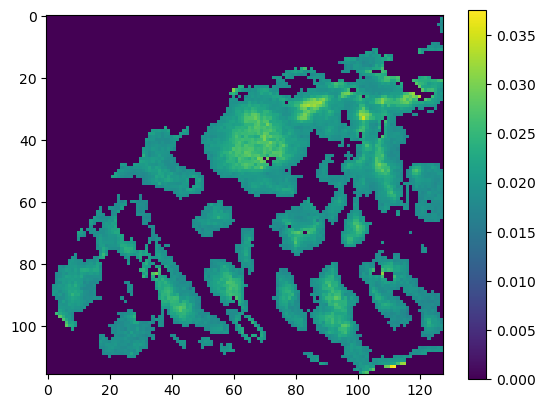

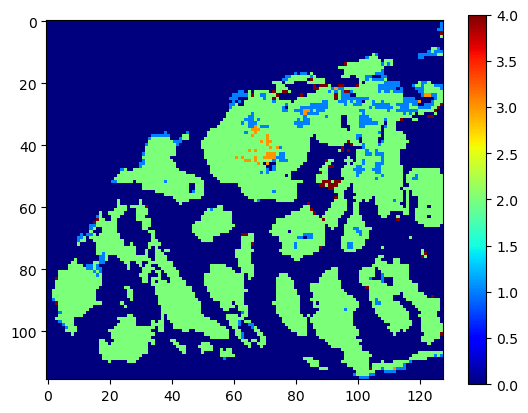

Correct prediction: 1.0


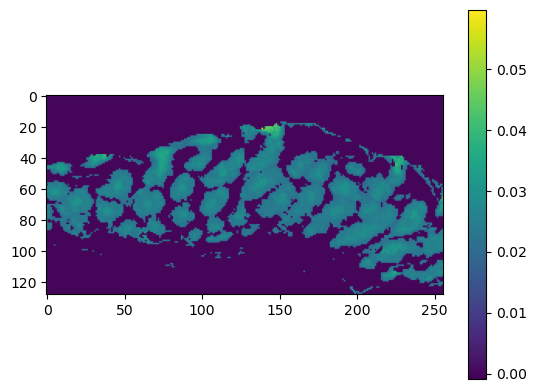

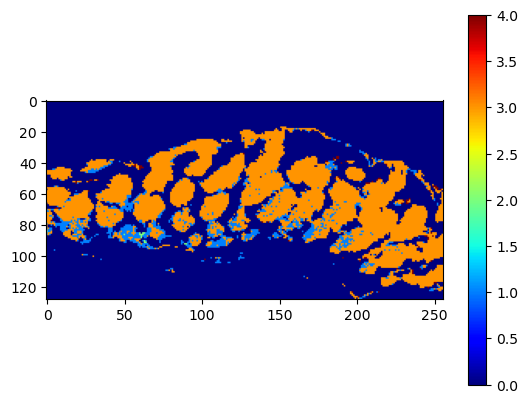

Correct prediction: 2.0


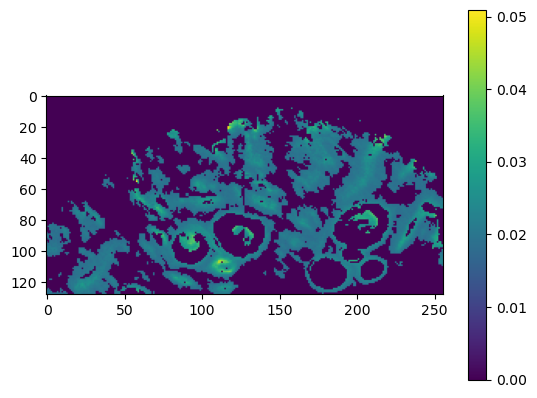

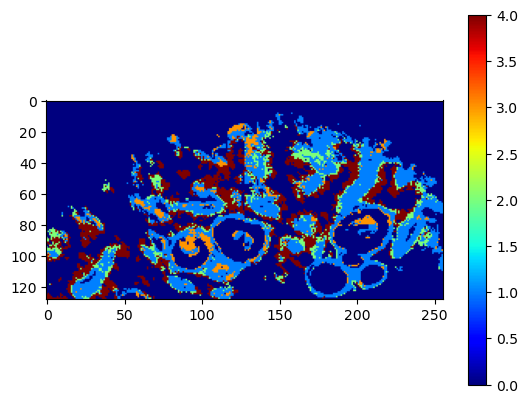

Correct prediction: 3.0


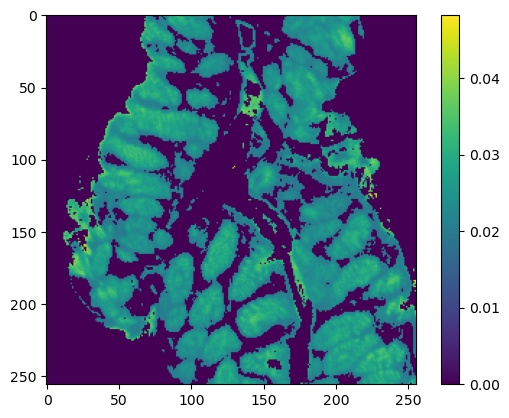

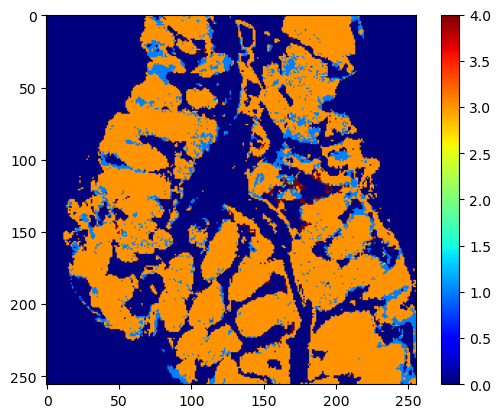

Correct prediction: 2.0


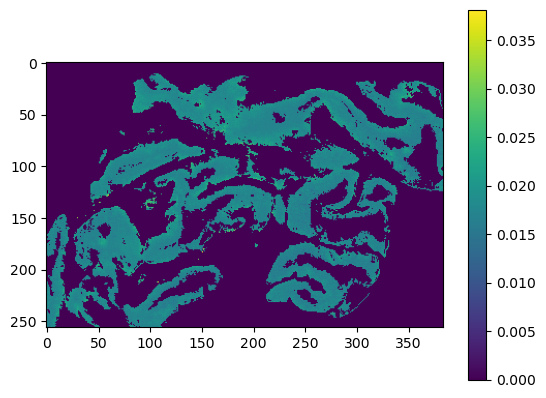

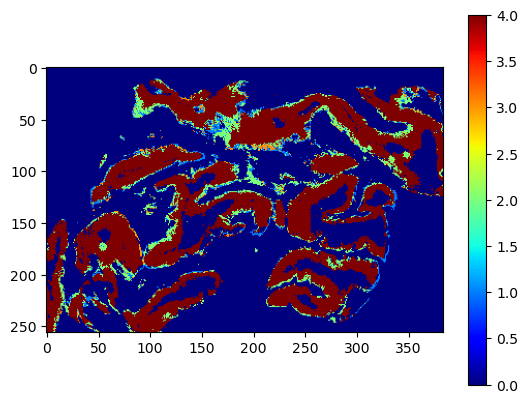

Correct prediction: 4.0


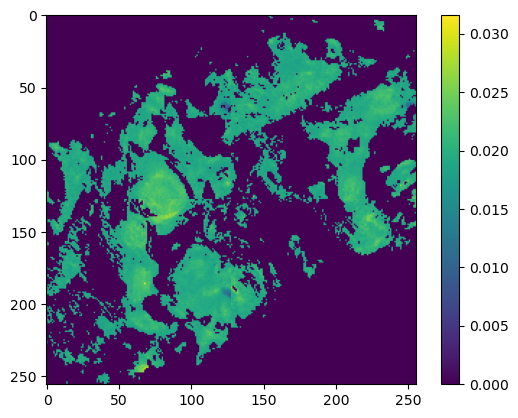

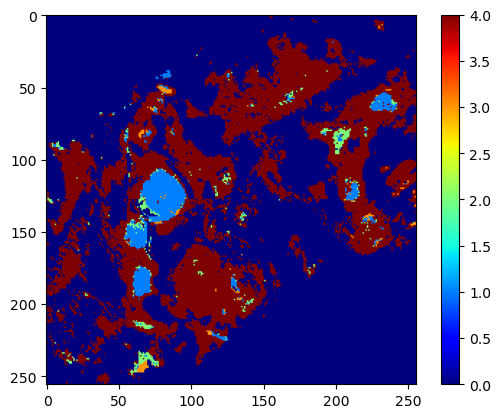

Correct prediction: 1.0


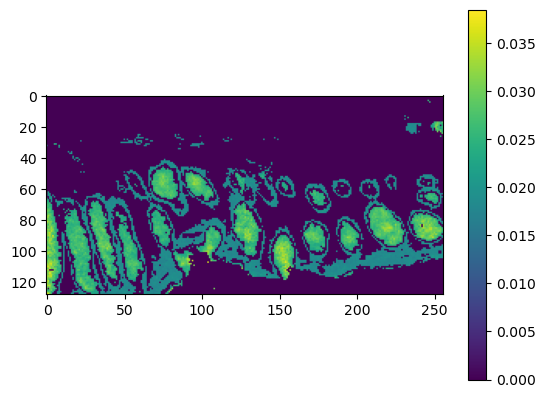

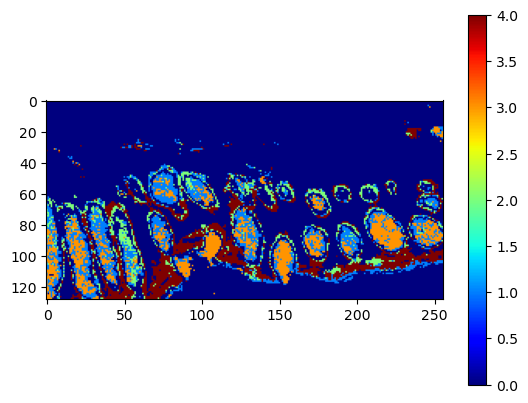

Correct prediction: 1.0


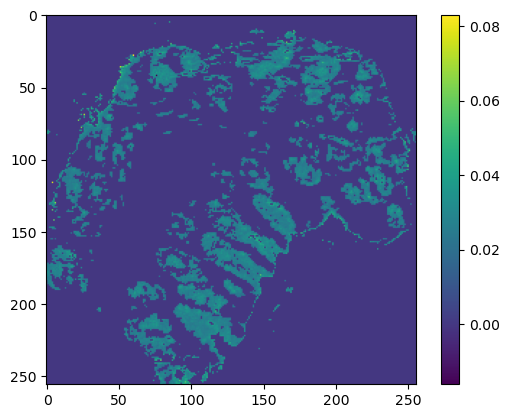

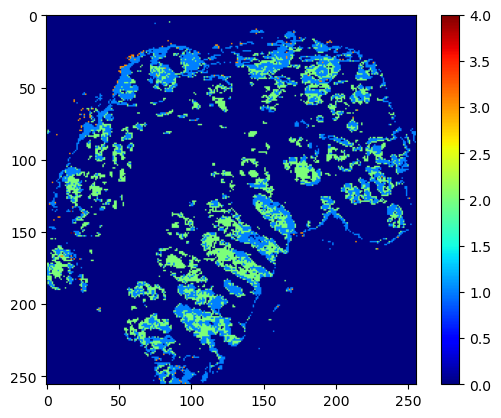

Correct prediction: 4.0


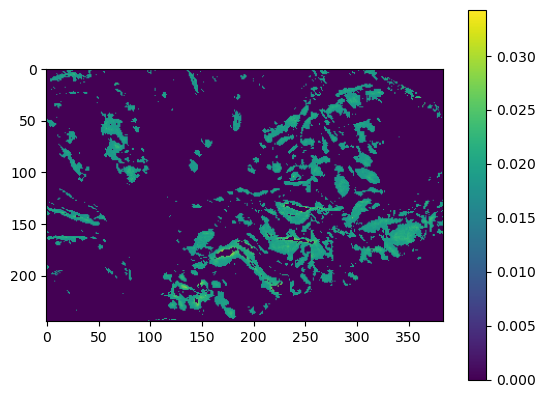

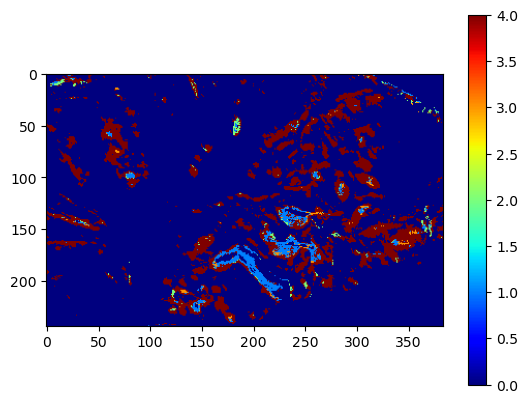

Correct prediction: 2.0


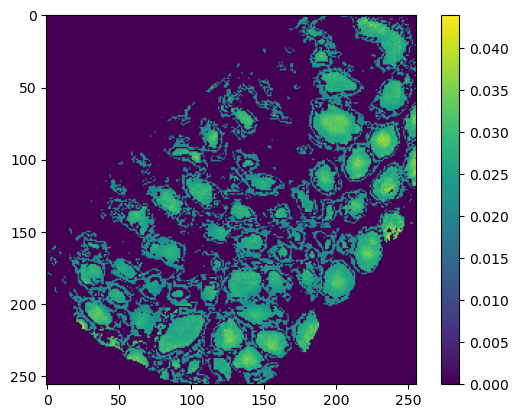

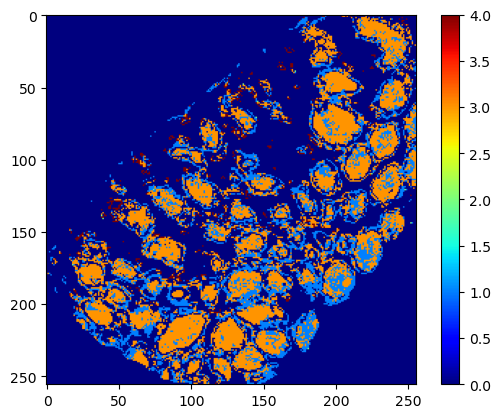

Correct prediction: 3.0


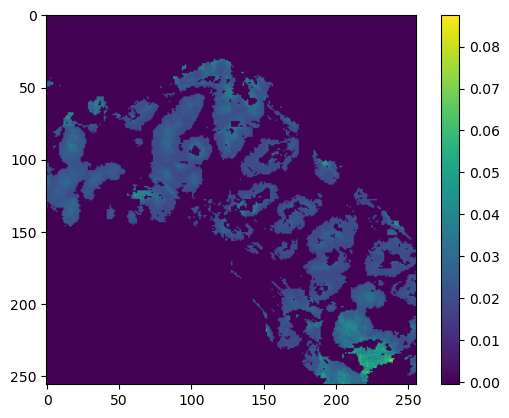

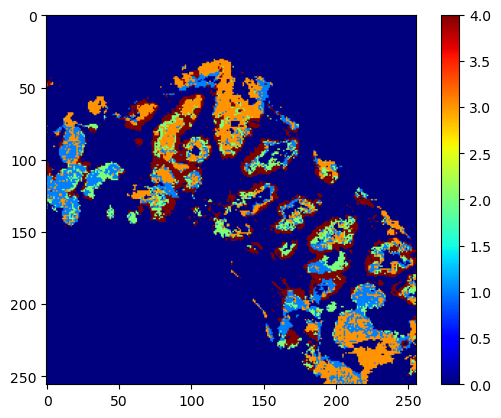

Correct prediction: 4.0


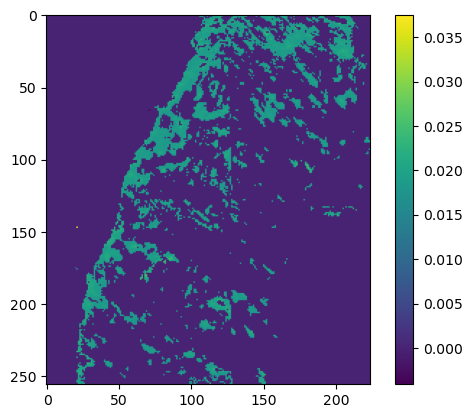

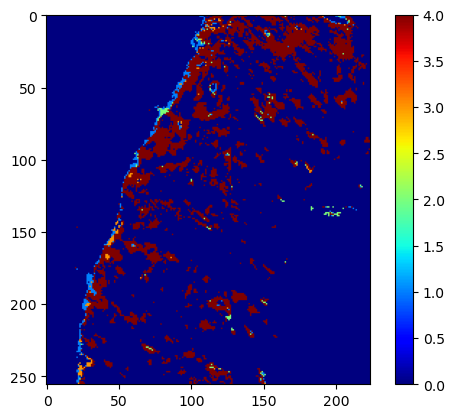

Correct prediction: 3.0


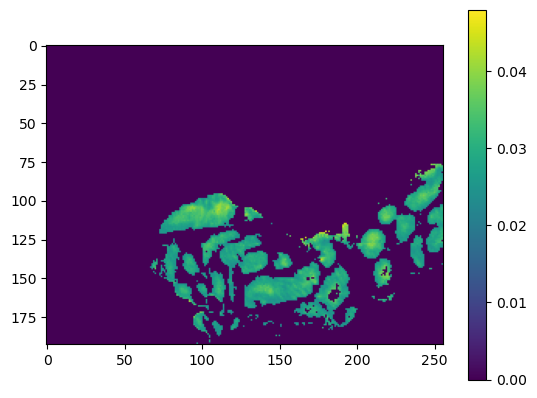

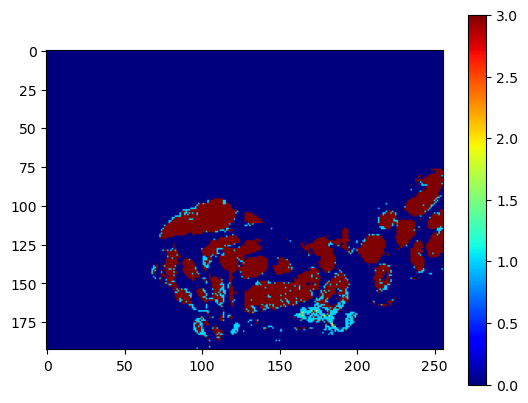

Correct prediction: 3.0


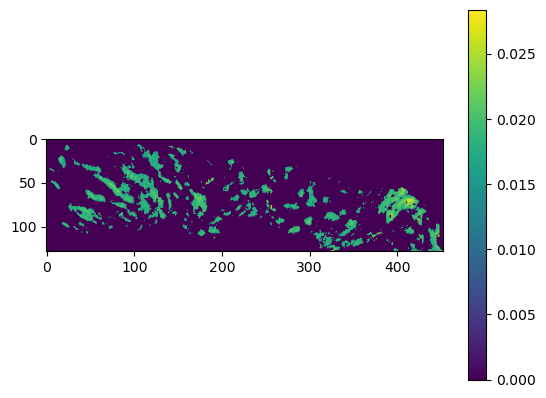

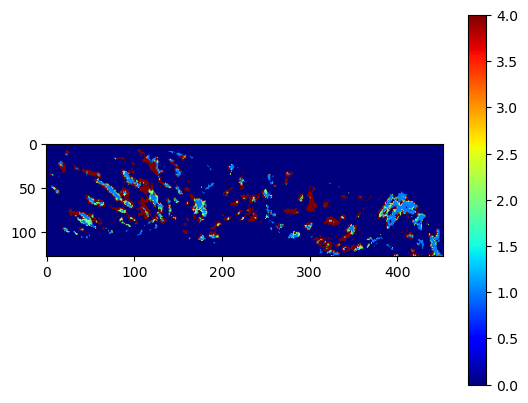

Correct prediction: 1.0


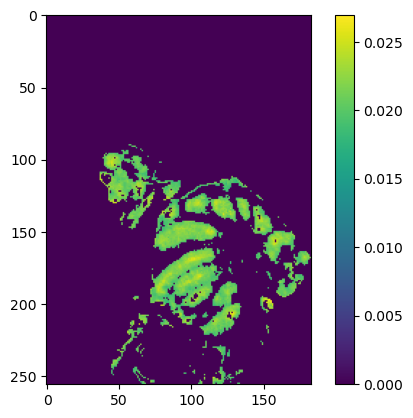

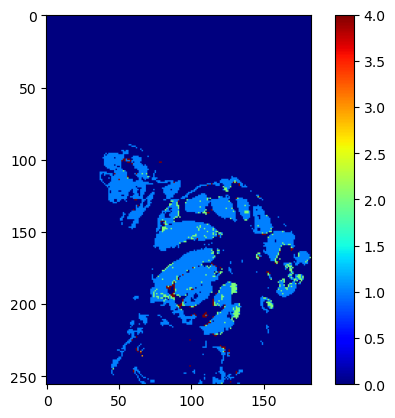

Correct prediction: 2.0


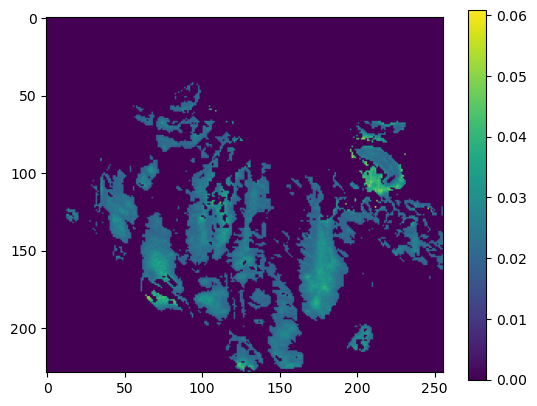

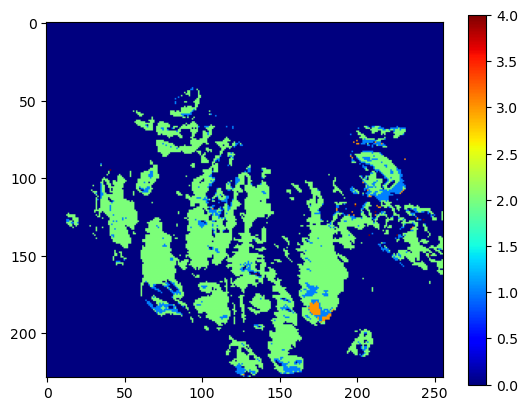

Correct prediction: 1.0


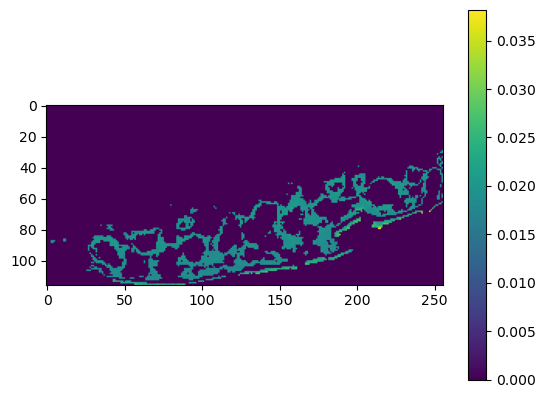

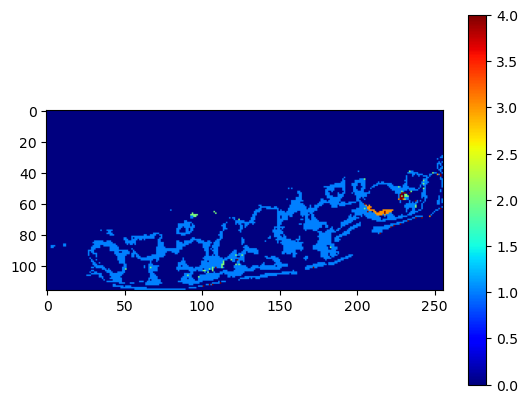

Correct prediction: 3.0


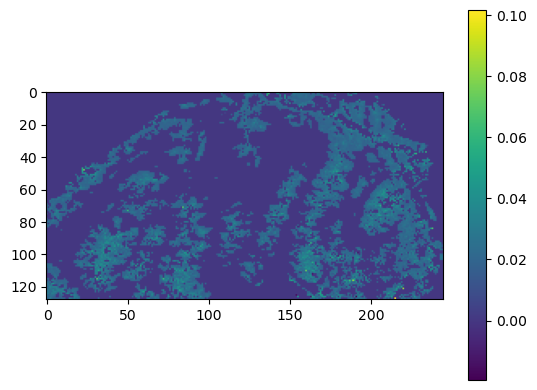

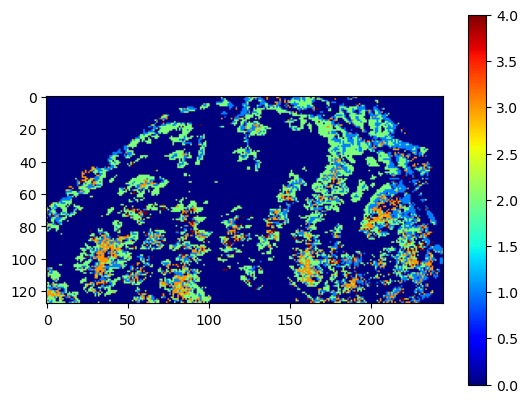

Correct prediction: 1.0


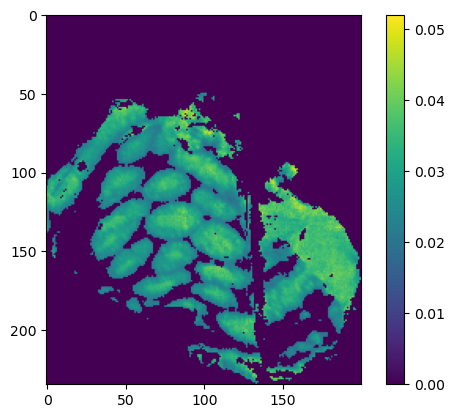

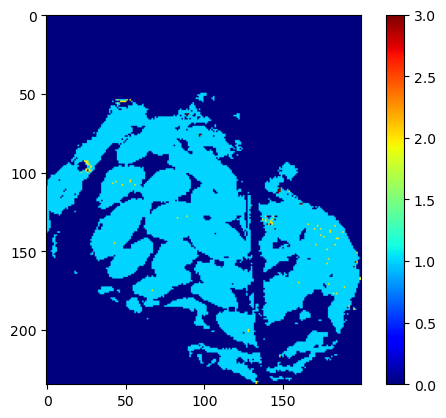

Correct prediction: 2.0


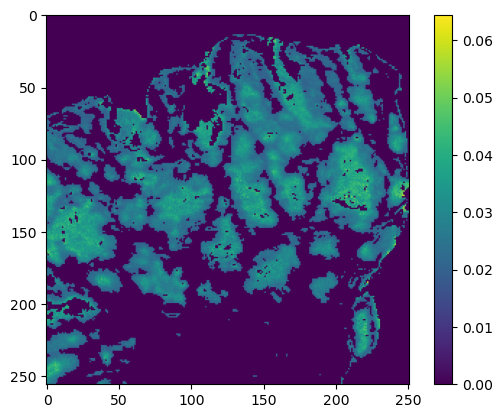

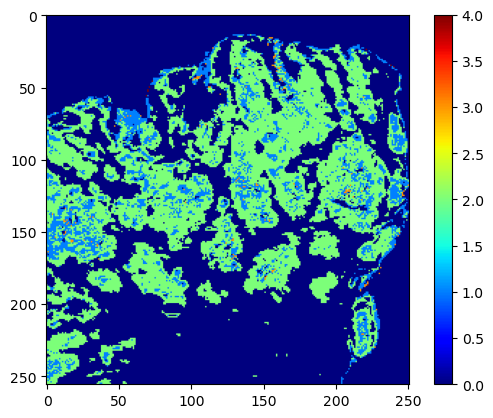

Correct prediction: 1.0


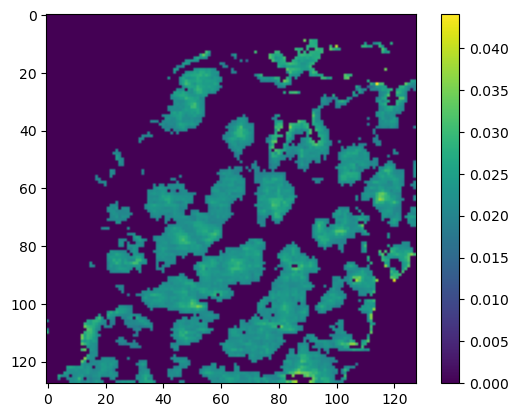

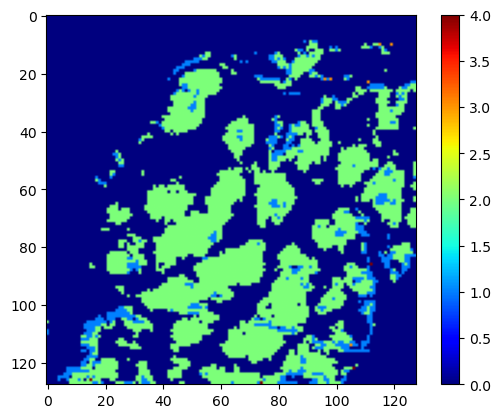

Correct prediction: 2.0


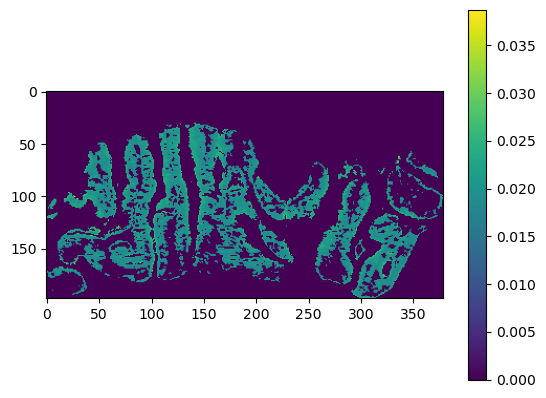

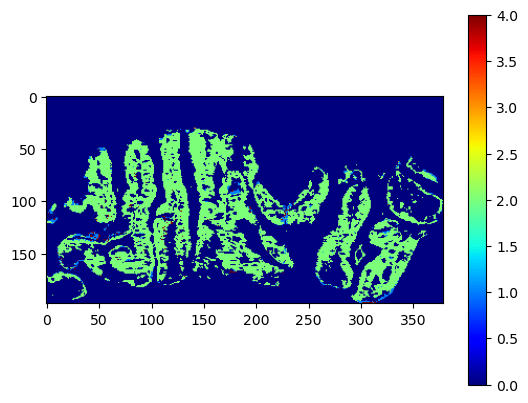

Correct prediction: 2.0


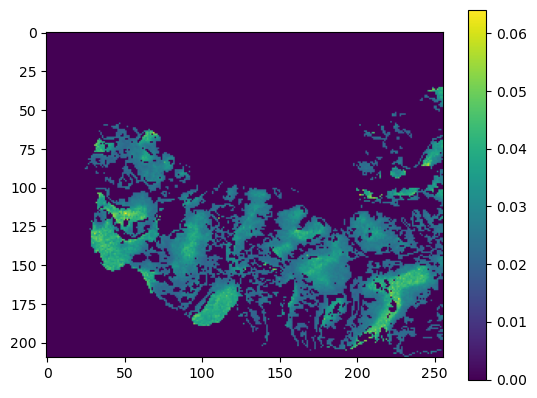

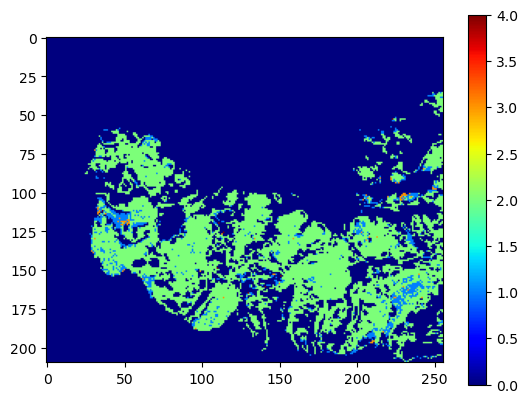

Correct prediction: 1.0


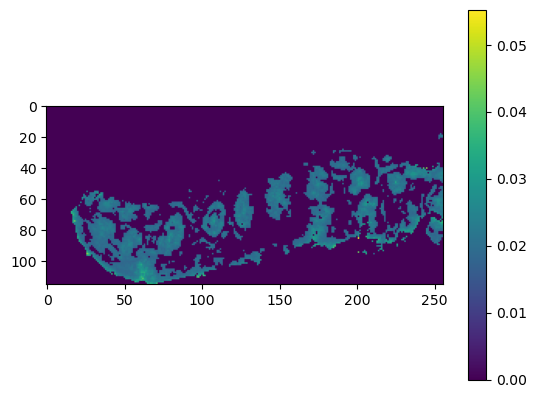

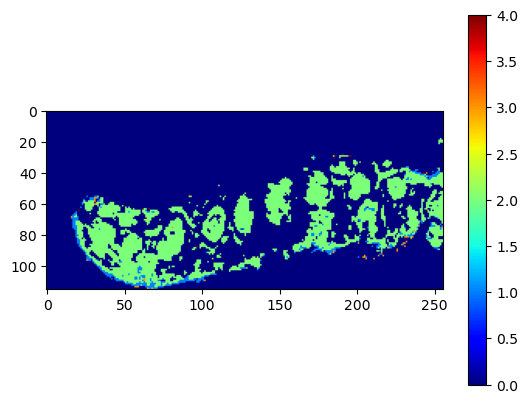

Correct prediction: 2.0


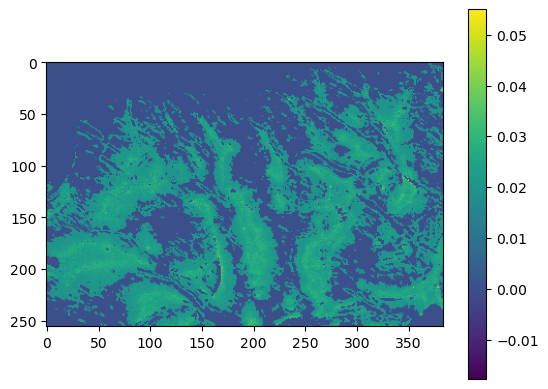

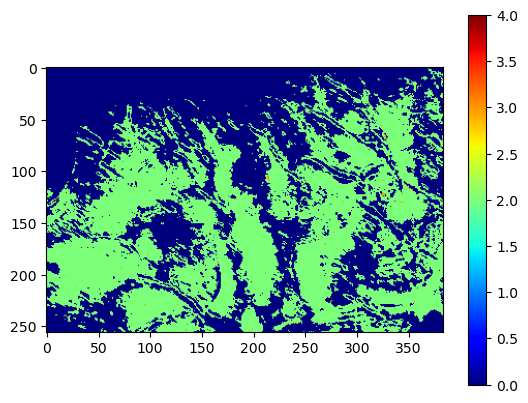

Correct prediction: 1.0


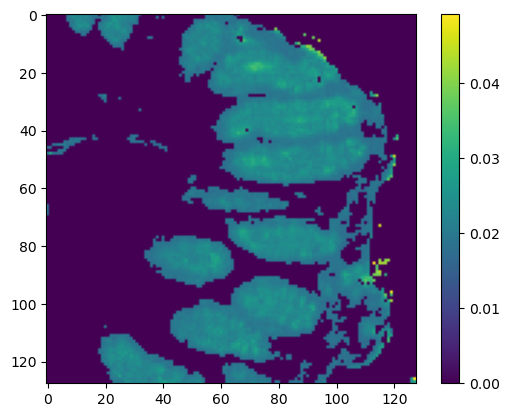

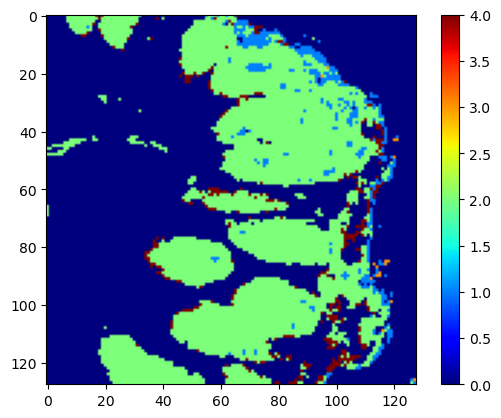

Correct prediction: 1.0


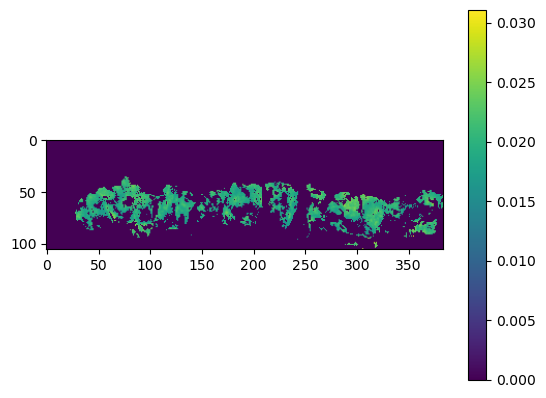

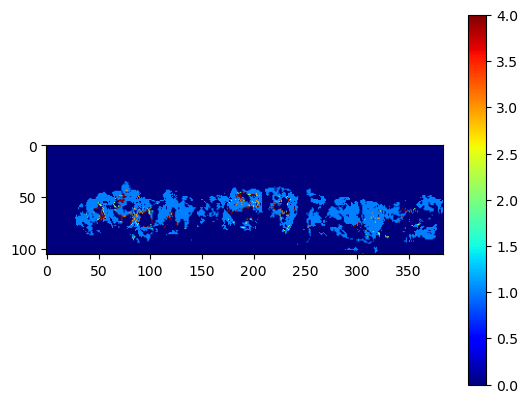

Correct prediction: 1.0


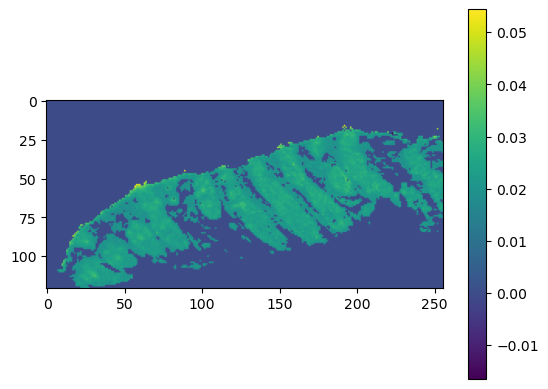

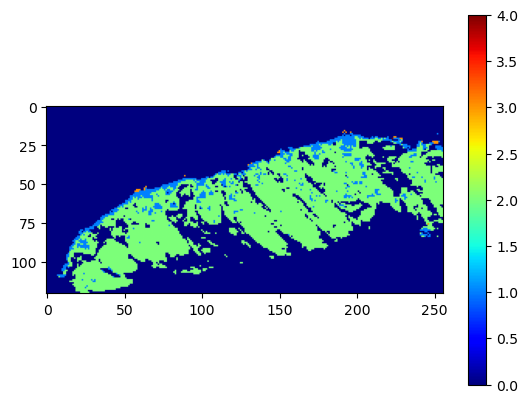

Correct prediction: 4.0


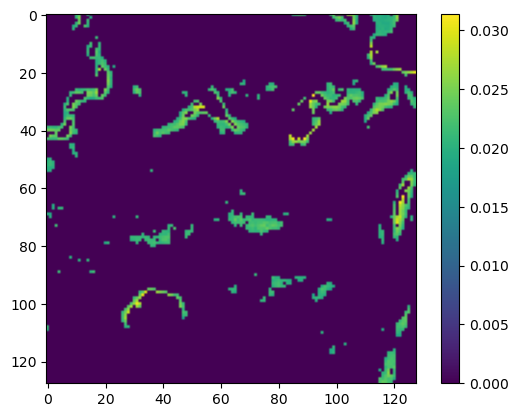

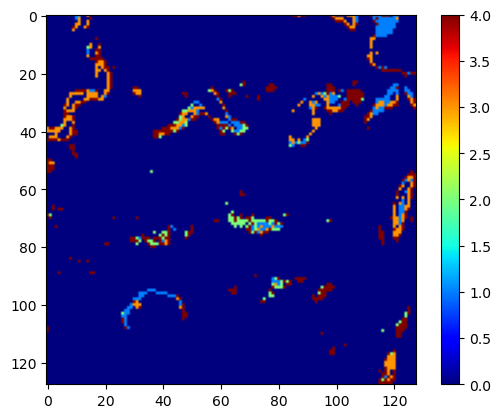

Correct prediction: 1.0


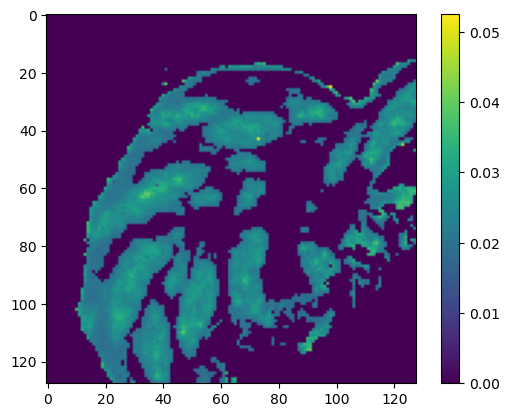

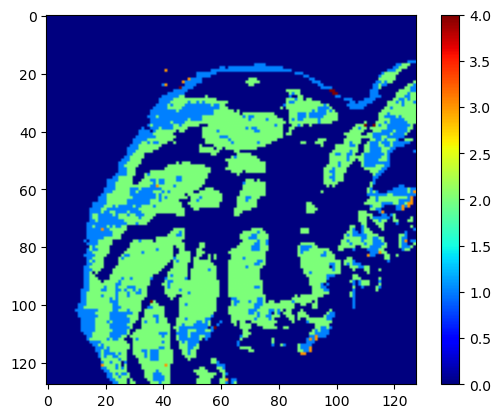

Correct prediction: 1.0


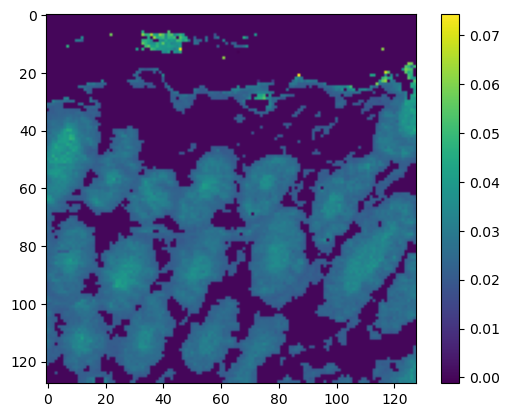

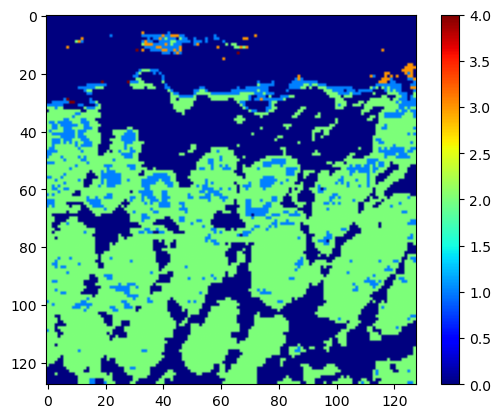

Correct prediction: 1.0


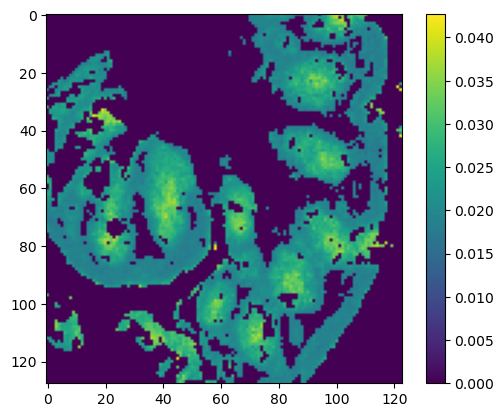

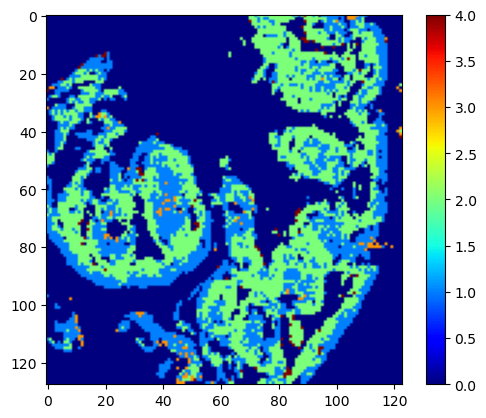

Correct prediction: 2.0


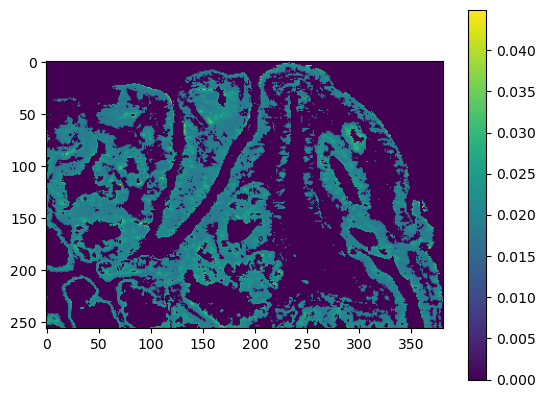

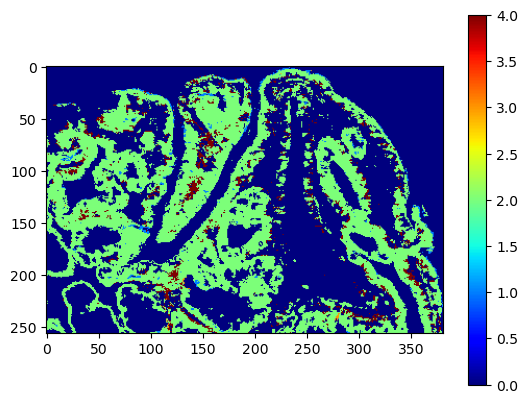

Correct prediction: 2.0


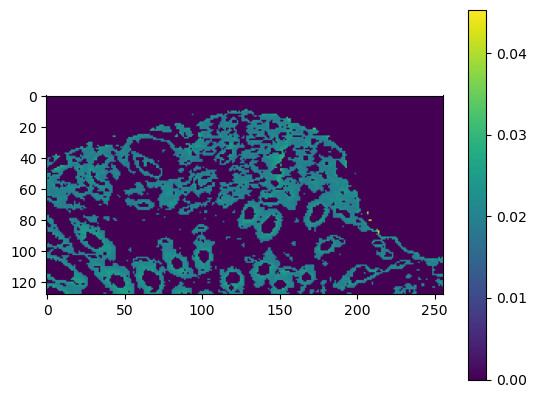

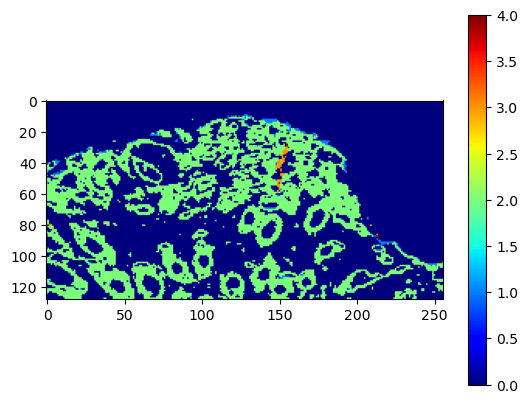

Correct prediction: 2.0


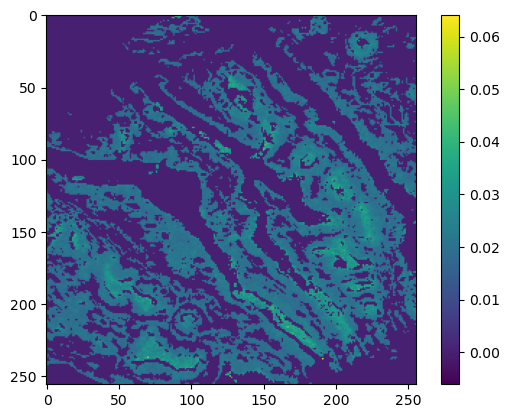

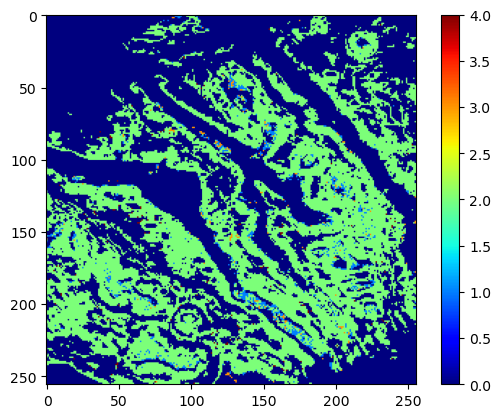

Correct prediction: 1.0


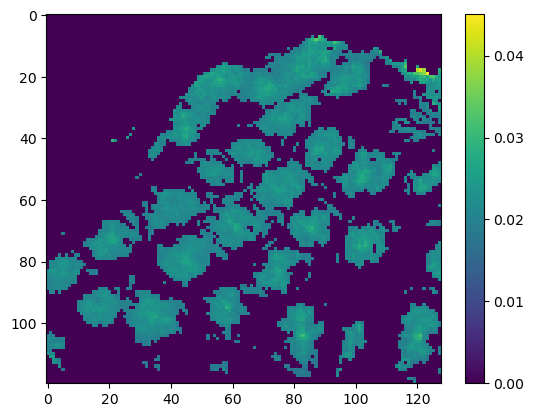

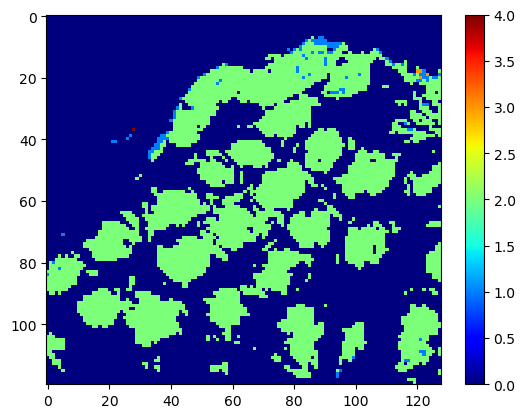

Correct prediction: 2.0


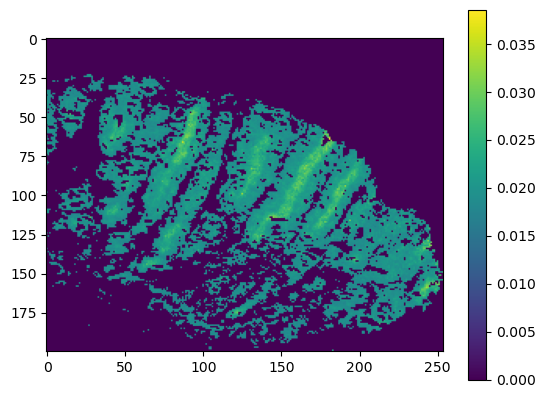

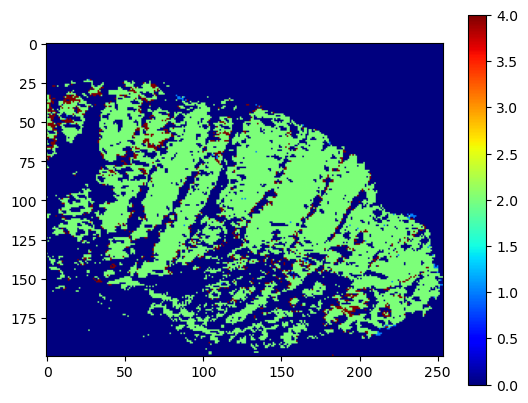

Correct prediction: 2.0


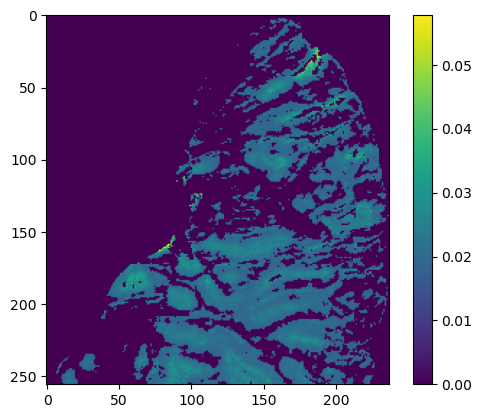

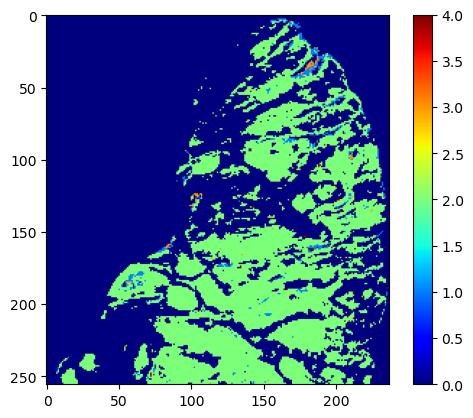

Correct prediction: 4.0


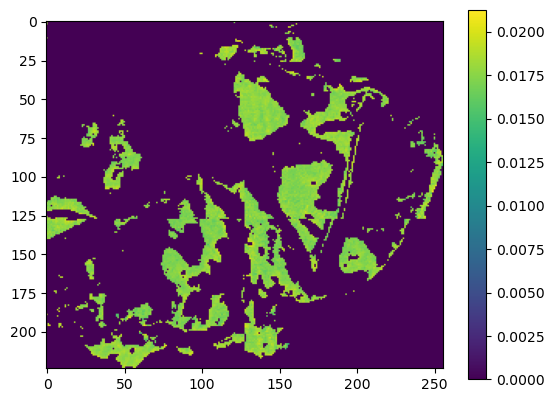

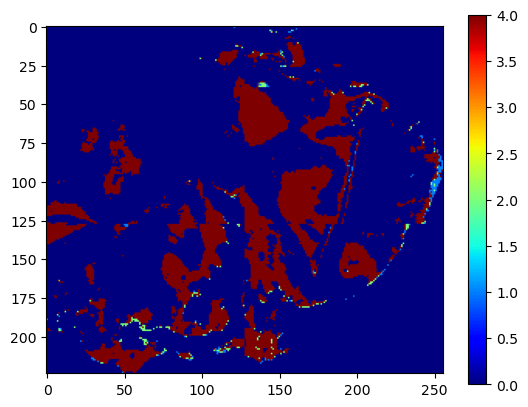

Correct prediction: 4.0


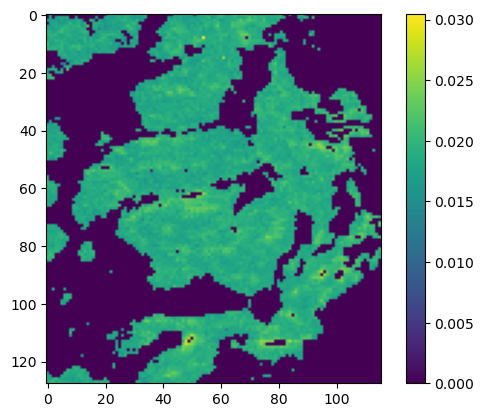

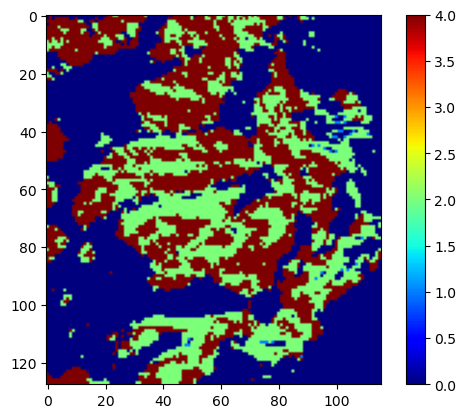

Correct prediction: 3.0


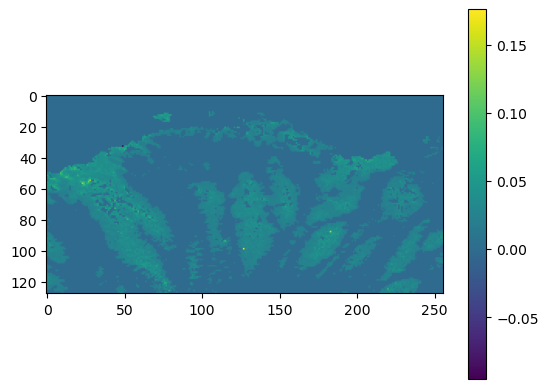

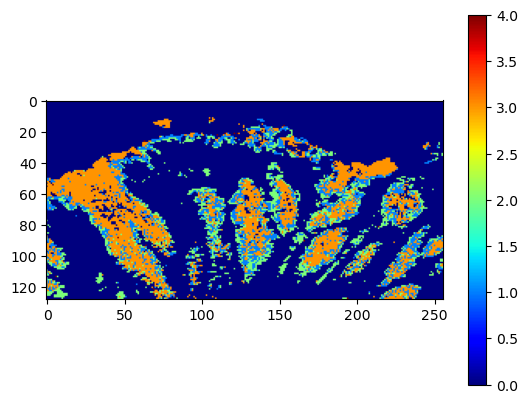

Correct prediction: 3.0


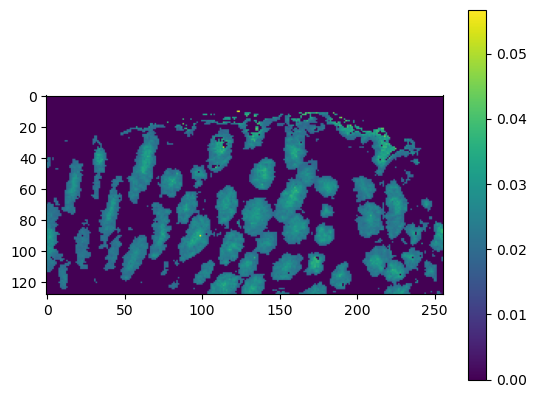

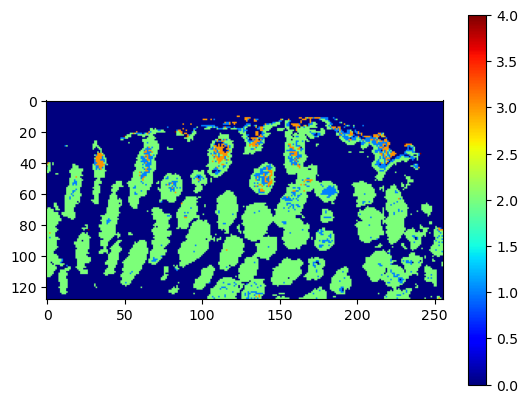

Correct prediction: 4.0


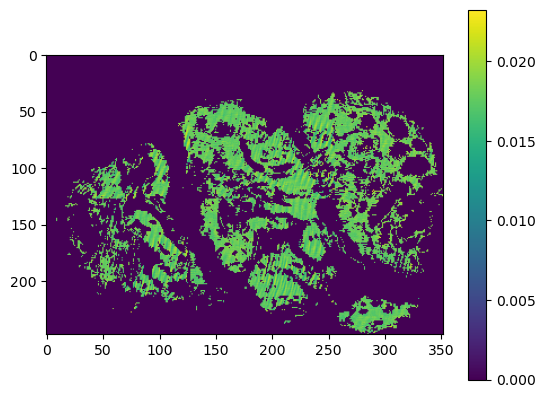

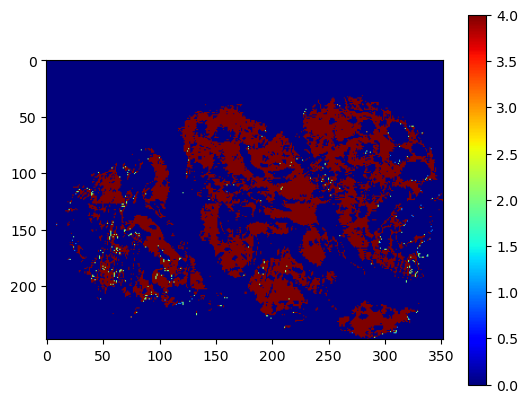

Correct prediction: 4.0


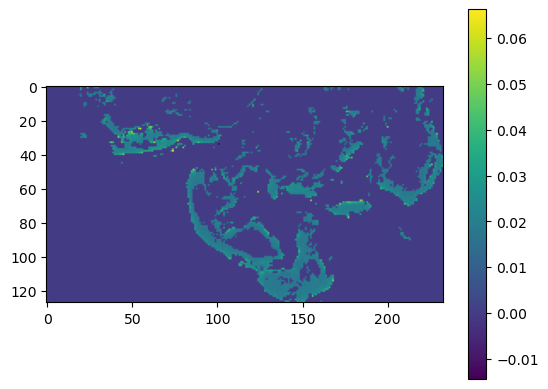

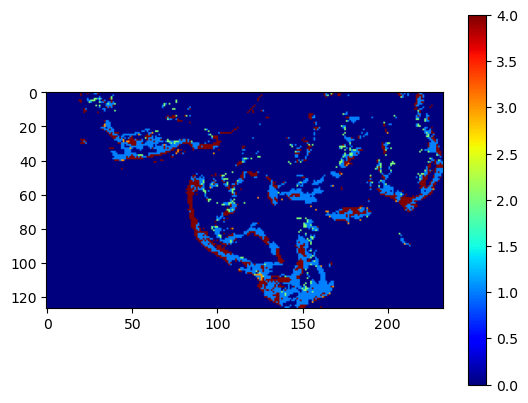

In [4]:
%load_ext autoreload
%autoreload 2 
import Processing.Sample as Sample
# sample_of_interest = 18
samples_of_interest = np.array([5, 8,  9, 14, 17, 18, 21, 23, 26, 27, 28, 33, 36, 41, 42, 44, 45, 47, 48, 54, 55, 58, 59, 60,
 63, 64, 65, 66, 70, 71, 72, 74, 78, 79, 80, 82, 83, 84, 85, 86, 87, 88, 89, 90])-1

samples: [Sample] = np.load("/local/scratch/Data/TROPHY/numpy/samples.npy", allow_pickle = True)
for sample_of_interest in samples_of_interest:
    sample_indices = np.where(samples_nums == sample_of_interest)[0]
    sample_coords = coords[sample_indices]
    sample_predictions = predictions[sample_indices]
    sample_true_outputs = true_outputs[sample_indices]
    sample_raw_inputs = raw_inputs[sample_indices]
    sample =  samples[sample_of_interest]

    # print(np.shape(sample_raw_inputs))
    # print(sample.x_size)
    # print(max(sample_coords[:,0]))
    # print(min(sample_coords[:,0]))
    # print(sample.y_size)
    # print(max(sample_coords[:,1]))
    # print(min(sample_coords[:,1]))

    data_view = sample.calculate_view_from_params(sample_coords, sample_raw_inputs, channel=50)
    predictions_view = sample.calculate_view_from_params(sample_coords, sample_predictions, channel=-1)
    print(f"Correct prediction: {sample_true_outputs[0]+1}")
    # correct_view = sample.calculate_view_from_params(sample_coords, sample_true_outputs, channel=-1)
    # print(np.shape(data_view))

    # print(np.unique(samples_nums))
    # print(sample_coords)
    import matplotlib.pyplot as plt
    plt.imshow(data_view)
    plt.colorbar()
    plt.show()
    plt.imshow(predictions_view, cmap='jet')
    plt.colorbar()
    plt.show()
    # plt.imshow(correct_view)
    # plt.colorbar()
    # plt.show()

In [1]:
def get_models_from_sweep(sweep_id, metric_name="val_overall_accuracy", 
                         threshold=50.0, entity="tjh200-university-of-cambridge", 
                         project="TROPHY", cache_dir="/local/scratch/models_cache"):
    """
    Retrieve all models from a wandb sweep that meet a certain performance threshold.
    Uses a persistent local cache to avoid re-downloading models.
    """
    import wandb
    import os
    import shutil
    
    # Create cache directory if it doesn't exist
    os.makedirs(cache_dir, exist_ok=True)
    
    # Initialize API
    api = wandb.Api()
    
    # Get all runs from the sweep
    sweep = api.sweep(f"{entity}/{project}/{sweep_id}")
    runs = sweep.runs
    
    print(f"Analyzing {len(runs)} runs...")
    
    selected_models = []
    
    for run in runs:
        # Skip failed runs
        if run.state != "finished":
            continue
            
        # First check if there's a pre-computed best metric in the summary
        best_metric_name = f"best_{metric_name}"
        best_metric_value = run.summary.get(best_metric_name)
        
        if best_metric_value is None:
            # Try to get from history
            history = run.scan_history(keys=[metric_name])
            metrics = [row.get(metric_name) for row in history if metric_name in row]
            if metrics:
                best_metric_value = max(metrics)
        
        # Skip if we couldn't find the metric
        if best_metric_value is None:
            print(f"  Could not find {metric_name} for run {run.name}")
            continue
            
        # Check if it meets our threshold
        print(f"Run {run.name}: {best_metric_value}")
        if best_metric_value > threshold:
            print(f"  Selected: {best_metric_value} > {threshold}")
            
            run_id = run.id
            
            # Create a unique directory for this run in our cache
            run_cache_dir = os.path.join(cache_dir, f"{run_id}")
            
            # Find the model artifact
            model_path = None
            try:
                # First check if we already have this model in our cache
                cached_models = []
                if os.path.exists(run_cache_dir):
                    cached_models = [f for f in os.listdir(run_cache_dir) if f.endswith('.pth')]
                
                if cached_models:
                    # Use the cached model
                    model_path = os.path.join(run_cache_dir, cached_models[0])
                    print(f"  Using cached model: {model_path}")
                else:
                    # Download the model
                    for artifact in run.logged_artifacts():
                        if artifact.type == "model" and "best-model" in artifact.name:
                            print(f"  Downloading artifact: {artifact.name}")
                            # Download to temporary location
                            temp_dir = artifact.download()
                            
                            # Find the model file
                            model_files = [f for f in os.listdir(temp_dir) if f.endswith('.pth')]
                            if model_files:
                                # Create run directory if needed
                                os.makedirs(run_cache_dir, exist_ok=True)
                                
                                # Copy model file to our persistent cache
                                src_path = os.path.join(temp_dir, model_files[0])
                                dst_path = os.path.join(run_cache_dir, model_files[0])
                                shutil.copy2(src_path, dst_path)
                                model_path = dst_path
                                print(f"  Copied model to persistent cache: {model_path}")
                                break
                
                if model_path:
                    model_info = {
                        "run_id": run_id,
                        "run_name": run.name,
                        "model_path": model_path,
                        "config": run.config,
                        "metric_value": best_metric_value
                    }
                    selected_models.append(model_info)
                    print(f"  Added model: {model_path}")
                else:
                    print(f"  No model file found for run {run.name}")
                    
            except Exception as e:
                print(f"  Error processing run {run.name}: {e}")
    
    print(f"\nFound {len(selected_models)} models above threshold {threshold}%")
    return selected_models

In [2]:
# Replace with your sweep ID
sweep_id = "i0y5hggy"

selected_models = get_models_from_sweep(sweep_id, "val_overall_accuracy", 0.5)
print(selected_models)
# Run ensemble voting on test set
# run_ensemble_voting_analysis(
#     sweep_id, 
#     threshold=0.5, 
#     eval_on="test",  # Change to "train" or "val" as needed
#     training_fold_number=1,
#     val_fold_number=0,
#     number_of_training_folds=2, 
#     validation_test_folds=2
# )

# To visualize specific samples only:
# run_ensemble_voting_analysis(sweep_id, display_sample_ids=[14, 42, 73])

Analyzing 272 runs...
Run skilled-sweep-271: 0.5918520396116038
  Selected: 0.5918520396116038 > 0.5


wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb:   1 of 1 files downloaded.  


  Copied model to persistent cache: /local/scratch/models_cache/6lg7zc1y/0.591852SCNN_TPL3skilled-sweep-271.pth
  Added model: /local/scratch/models_cache/6lg7zc1y/0.591852SCNN_TPL3skilled-sweep-271.pth
Run twilight-sweep-269: 0.4584049017778091
Run rose-sweep-268: 0.4823842070794375
Run lilac-sweep-267: 0.61761438857174
  Selected: 0.61761438857174 > 0.5


wandb:   1 of 1 files downloaded.  


  Copied model to persistent cache: /local/scratch/models_cache/6m8ku8i5/0.617614SCNN_TPL3lilac-sweep-267.pth
  Added model: /local/scratch/models_cache/6m8ku8i5/0.617614SCNN_TPL3lilac-sweep-267.pth
Run earthy-sweep-266: 0.6135313011043756
  Selected: 0.6135313011043756 > 0.5


wandb:   1 of 1 files downloaded.  


  Copied model to persistent cache: /local/scratch/models_cache/49omxo1m/0.613531SCNN_TPL3earthy-sweep-266.pth
  Added model: /local/scratch/models_cache/49omxo1m/0.613531SCNN_TPL3earthy-sweep-266.pth
Run swept-sweep-265: 0.5831910957008508
  Selected: 0.5831910957008508 > 0.5


wandb:   1 of 1 files downloaded.  


  Copied model to persistent cache: /local/scratch/models_cache/lvhf0klz/0.583191SCNN_TPL3swept-sweep-265.pth
  Added model: /local/scratch/models_cache/lvhf0klz/0.583191SCNN_TPL3swept-sweep-265.pth
Run lunar-sweep-264: 0.6312390096271081
  Selected: 0.6312390096271081 > 0.5


wandb:   1 of 1 files downloaded.  


  Copied model to persistent cache: /local/scratch/models_cache/gr9x0y5o/0.631239SCNN_TPL3lunar-sweep-264.pth
  Added model: /local/scratch/models_cache/gr9x0y5o/0.631239SCNN_TPL3lunar-sweep-264.pth
Run comfy-sweep-263: 0.4014885523626246
Run soft-sweep-262: 0.4949554071565748
Run lunar-sweep-261: 0.6367425858026932
  Selected: 0.6367425858026932 > 0.5


wandb:   1 of 1 files downloaded.  


  Copied model to persistent cache: /local/scratch/models_cache/ne59rdm8/0.636743SCNN_TPL3lunar-sweep-261.pth
  Added model: /local/scratch/models_cache/ne59rdm8/0.636743SCNN_TPL3lunar-sweep-261.pth
Run ethereal-sweep-260: 0.6236111611295071
  Selected: 0.6236111611295071 > 0.5


wandb:   1 of 1 files downloaded.  


  Copied model to persistent cache: /local/scratch/models_cache/bi88rmqb/0.623611SCNN_TPL3ethereal-sweep-260.pth
  Added model: /local/scratch/models_cache/bi88rmqb/0.623611SCNN_TPL3ethereal-sweep-260.pth
Run sage-sweep-259: 0.636684481136505
  Selected: 0.636684481136505 > 0.5


wandb:   1 of 1 files downloaded.  


  Copied model to persistent cache: /local/scratch/models_cache/w51t1mfw/0.636684SCNN_TPL3sage-sweep-259.pth
  Added model: /local/scratch/models_cache/w51t1mfw/0.636684SCNN_TPL3sage-sweep-259.pth
Run magic-sweep-258: 0.6143612579681482
  Selected: 0.6143612579681482 > 0.5


wandb:   1 of 1 files downloaded.  


  Copied model to persistent cache: /local/scratch/models_cache/00qqwyo7/0.614361SCNN_TPL3magic-sweep-258.pth
  Added model: /local/scratch/models_cache/00qqwyo7/0.614361SCNN_TPL3magic-sweep-258.pth
Run summer-sweep-257: 0.5856205228317939
  Selected: 0.5856205228317939 > 0.5


wandb:   1 of 1 files downloaded.  


  Copied model to persistent cache: /local/scratch/models_cache/9tdi02o7/0.585621SCNN_TPL3summer-sweep-257.pth
  Added model: /local/scratch/models_cache/9tdi02o7/0.585621SCNN_TPL3summer-sweep-257.pth
Run smart-sweep-256: 0.5968335545549951
  Selected: 0.5968335545549951 > 0.5


wandb:   1 of 1 files downloaded.  


  Copied model to persistent cache: /local/scratch/models_cache/m1qf6xhk/0.596834SCNN_TPL3smart-sweep-256.pth
  Added model: /local/scratch/models_cache/m1qf6xhk/0.596834SCNN_TPL3smart-sweep-256.pth
Run splendid-sweep-255: 0.5621535007179556
  Selected: 0.5621535007179556 > 0.5


wandb:   1 of 1 files downloaded.  


  Copied model to persistent cache: /local/scratch/models_cache/qxkopkdo/0.562154SCNN_TPL3splendid-sweep-255.pth
  Added model: /local/scratch/models_cache/qxkopkdo/0.562154SCNN_TPL3splendid-sweep-255.pth
Run eager-sweep-254: 0.437349845186516
Run spring-sweep-253: 0.6252631896494125
  Selected: 0.6252631896494125 > 0.5


wandb:   1 of 1 files downloaded.  


  Copied model to persistent cache: /local/scratch/models_cache/xw18ihpd/0.625263SCNN_TPL3spring-sweep-253.pth
  Added model: /local/scratch/models_cache/xw18ihpd/0.625263SCNN_TPL3spring-sweep-253.pth
Run copper-sweep-252: 0.6228488239052528
  Selected: 0.6228488239052528 > 0.5


wandb:   1 of 1 files downloaded.  


  Copied model to persistent cache: /local/scratch/models_cache/7g7f86v2/0.622849SCNN_TPL3copper-sweep-252.pth
  Added model: /local/scratch/models_cache/7g7f86v2/0.622849SCNN_TPL3copper-sweep-252.pth
Run fallen-sweep-251: 0.4413183277134819
Run balmy-sweep-250: 0.6557114564893368
  Selected: 0.6557114564893368 > 0.5


wandb:   1 of 1 files downloaded.  


  Copied model to persistent cache: /local/scratch/models_cache/hg493qwc/0.655711SCNN_TPL3balmy-sweep-250.pth
  Added model: /local/scratch/models_cache/hg493qwc/0.655711SCNN_TPL3balmy-sweep-250.pth
Run faithful-sweep-249: 0.545660188100232
  Selected: 0.545660188100232 > 0.5


wandb:   1 of 1 files downloaded.  


  Copied model to persistent cache: /local/scratch/models_cache/z1k9mp94/0.545660SCNN_TPL3faithful-sweep-249.pth
  Added model: /local/scratch/models_cache/z1k9mp94/0.545660SCNN_TPL3faithful-sweep-249.pth
Run eternal-sweep-248: 0.6334328535319791
  Selected: 0.6334328535319791 > 0.5


wandb:   1 of 1 files downloaded.  


  Copied model to persistent cache: /local/scratch/models_cache/nw5ah9e2/0.633433SCNN_TPL3eternal-sweep-248.pth
  Added model: /local/scratch/models_cache/nw5ah9e2/0.633433SCNN_TPL3eternal-sweep-248.pth
Run iconic-sweep-247: 0.5774302769109066
  Selected: 0.5774302769109066 > 0.5


wandb:   1 of 1 files downloaded.  


  Copied model to persistent cache: /local/scratch/models_cache/2jwxwp6e/0.577430SCNN_TPL3iconic-sweep-247.pth
  Added model: /local/scratch/models_cache/2jwxwp6e/0.577430SCNN_TPL3iconic-sweep-247.pth
Run worldly-sweep-246: 0.6105911849219874
  Selected: 0.6105911849219874 > 0.5


wandb:   1 of 1 files downloaded.  


  Copied model to persistent cache: /local/scratch/models_cache/8xrjwky6/0.610591SCNN_TPL3worldly-sweep-246.pth
  Added model: /local/scratch/models_cache/8xrjwky6/0.610591SCNN_TPL3worldly-sweep-246.pth
Run true-sweep-245: 0.674788491977334
  Selected: 0.674788491977334 > 0.5


wandb:   1 of 1 files downloaded.  


  Copied model to persistent cache: /local/scratch/models_cache/2b9z2hgk/0.674788SCNN_TPL3true-sweep-245.pth
  Added model: /local/scratch/models_cache/2b9z2hgk/0.674788SCNN_TPL3true-sweep-245.pth
Run frosty-sweep-244: 0.5913449349366067
  Selected: 0.5913449349366067 > 0.5


wandb:   1 of 1 files downloaded.  


  Copied model to persistent cache: /local/scratch/models_cache/6n4re0ka/0.591345SCNN_TPL3frosty-sweep-244.pth
  Added model: /local/scratch/models_cache/6n4re0ka/0.591345SCNN_TPL3frosty-sweep-244.pth
Run upbeat-sweep-243: 0.5420785705674033
  Selected: 0.5420785705674033 > 0.5


wandb:   1 of 1 files downloaded.  


  Copied model to persistent cache: /local/scratch/models_cache/lhnpzo99/0.542079SCNN_TPL3upbeat-sweep-243.pth
  Added model: /local/scratch/models_cache/lhnpzo99/0.542079SCNN_TPL3upbeat-sweep-243.pth
Run woven-sweep-242: 0.5835134287797926
  Selected: 0.5835134287797926 > 0.5


wandb:   1 of 1 files downloaded.  


  Copied model to persistent cache: /local/scratch/models_cache/zo0afj3v/0.583513SCNN_TPL3woven-sweep-242.pth
  Added model: /local/scratch/models_cache/zo0afj3v/0.583513SCNN_TPL3woven-sweep-242.pth
Run balmy-sweep-241: 0.4287941063476044
Run olive-sweep-240: 0.5830712625341311
  Selected: 0.5830712625341311 > 0.5


wandb:   1 of 1 files downloaded.  


  Copied model to persistent cache: /local/scratch/models_cache/cqqdd8cu/0.583071SCNN_TPL3olive-sweep-240.pth
  Added model: /local/scratch/models_cache/cqqdd8cu/0.583071SCNN_TPL3olive-sweep-240.pth
Run exalted-sweep-239: 0.6135278586266122
  Selected: 0.6135278586266122 > 0.5


wandb:   1 of 1 files downloaded.  


  Copied model to persistent cache: /local/scratch/models_cache/7p29s08j/0.613528SCNN_TPL3exalted-sweep-239.pth
  Added model: /local/scratch/models_cache/7p29s08j/0.613528SCNN_TPL3exalted-sweep-239.pth
Run clean-sweep-238: 0.5976293812037854
  Selected: 0.5976293812037854 > 0.5


wandb:   1 of 1 files downloaded.  


  Copied model to persistent cache: /local/scratch/models_cache/x15qebii/0.597629SCNN_TPL3clean-sweep-238.pth
  Added model: /local/scratch/models_cache/x15qebii/0.597629SCNN_TPL3clean-sweep-238.pth
Run apricot-sweep-237: 0.5929581106377473
  Selected: 0.5929581106377473 > 0.5


wandb:   1 of 1 files downloaded.  


  Copied model to persistent cache: /local/scratch/models_cache/9keb5xqz/0.592958SCNN_TPL3apricot-sweep-237.pth
  Added model: /local/scratch/models_cache/9keb5xqz/0.592958SCNN_TPL3apricot-sweep-237.pth
Run vibrant-sweep-236: 0.5993092568017728
  Selected: 0.5993092568017728 > 0.5


wandb:   1 of 1 files downloaded.  


  Copied model to persistent cache: /local/scratch/models_cache/nmtx8oqp/0.599309SCNN_TPL3vibrant-sweep-236.pth
  Added model: /local/scratch/models_cache/nmtx8oqp/0.599309SCNN_TPL3vibrant-sweep-236.pth
Run hearty-sweep-235: 0.6367311719092467
  Selected: 0.6367311719092467 > 0.5


wandb:   1 of 1 files downloaded.  


  Copied model to persistent cache: /local/scratch/models_cache/q7axcl0p/0.636731SCNN_TPL3hearty-sweep-235.pth
  Added model: /local/scratch/models_cache/q7axcl0p/0.636731SCNN_TPL3hearty-sweep-235.pth
Run fiery-sweep-234: 0.6085793670144329
  Selected: 0.6085793670144329 > 0.5


wandb:   1 of 1 files downloaded.  


  Copied model to persistent cache: /local/scratch/models_cache/jwwrcn0z/0.608579SCNN_TPL3fiery-sweep-234.pth
  Added model: /local/scratch/models_cache/jwwrcn0z/0.608579SCNN_TPL3fiery-sweep-234.pth
Run colorful-sweep-233: 0.5975005827291376
  Selected: 0.5975005827291376 > 0.5


wandb:   1 of 1 files downloaded.  


  Copied model to persistent cache: /local/scratch/models_cache/nev4jz5d/0.597501SCNN_TPL3colorful-sweep-233.pth
  Added model: /local/scratch/models_cache/nev4jz5d/0.597501SCNN_TPL3colorful-sweep-233.pth
Run fearless-sweep-232: 0.6255717898976714
  Selected: 0.6255717898976714 > 0.5


wandb:   1 of 1 files downloaded.  


  Copied model to persistent cache: /local/scratch/models_cache/4te1tcop/0.616063SCNN_TPL3fearless-sweep-232.pth
  Added model: /local/scratch/models_cache/4te1tcop/0.616063SCNN_TPL3fearless-sweep-232.pth
Run avid-sweep-231: 0.5681165761770454
  Selected: 0.5681165761770454 > 0.5


wandb:   1 of 1 files downloaded.  


  Copied model to persistent cache: /local/scratch/models_cache/s472vfaw/0.568117SCNN_TPL3avid-sweep-231.pth
  Added model: /local/scratch/models_cache/s472vfaw/0.568117SCNN_TPL3avid-sweep-231.pth
Run dauntless-sweep-230: 0.6374666714435326
  Selected: 0.6374666714435326 > 0.5


wandb:   1 of 1 files downloaded.  


  Copied model to persistent cache: /local/scratch/models_cache/s83mu7vq/0.637467SCNN_TPL3dauntless-sweep-230.pth
  Added model: /local/scratch/models_cache/s83mu7vq/0.637467SCNN_TPL3dauntless-sweep-230.pth
Run colorful-sweep-229: 0.563722305557655
  Selected: 0.563722305557655 > 0.5
  Using cached model: /local/scratch/models_cache/5z5hd7t5/0.563722SCNN_TPL3colorful-sweep-229.pth
  Added model: /local/scratch/models_cache/5z5hd7t5/0.563722SCNN_TPL3colorful-sweep-229.pth
Run electric-sweep-228: 0.5863423112309695
  Selected: 0.5863423112309695 > 0.5
  Using cached model: /local/scratch/models_cache/0mv6d00b/0.586342SCNN_TPL3electric-sweep-228.pth
  Added model: /local/scratch/models_cache/0mv6d00b/0.586342SCNN_TPL3electric-sweep-228.pth
Run drawn-sweep-227: 0.5608689793415171
  Selected: 0.5608689793415171 > 0.5
  Using cached model: /local/scratch/models_cache/ndln0bah/0.560869SCNN_TPL3drawn-sweep-227.pth
  Added model: /local/scratch/models_cache/ndln0bah/0.560869SCNN_TPL3drawn-sweep

In [ ]:



%load_ext autoreload
%autoreload 2  
import sys
import os
parent_dir = os.path.abspath(os.path.join(os.getcwd(), '..'))
sys.path.insert(0, parent_dir)
import torch
import numpy as np
from Processing.Sample import Sample
import numpy as np
from torch.utils.data import DataLoader, TensorDataset 
import torch.nn as nn
import torch.optim as optimise
from torch.optim.lr_scheduler import StepLR
from Models.Core_CNN import Core_CNN
from Models.Core_CNN_TPL import Core_CNN_TPL
from Models.SCNN_TPL import SCNN_TPL
from Models.SCNN_TPL3 import SCNN_TPL3
from Processing.Trainer import Trainer
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score

# print(best_object)

trainer = Trainer()
# config = best_object['config']['model_config']
apriori_relevance = torch.ones(801).to('cuda')
# Core_CNN_TPL: "/local/scratch/Data/TROPHY/Models/5.92Core_CNN_TPL.pth"
total_eval_confusion_matrix, predictions, true_outputs, raw_inputs, coords, samples_nums, evaluated_sample_nums = trainer.chat_evaluate_multiple_models(SCNN_TPL3, selected_models, 1, 4, 5120, apriori_relevance, eval_on="test", training_fold_number=0, val_fold_number=0, number_of_training_folds=2, validation_test_folds=2)
print(total_eval_confusion_matrix)
from Processing.misc import calculate_performance_stats_by_class
stats = calculate_performance_stats_by_class(total_eval_confusion_matrix)

print("Accuracy: ", stats[2])
print("Sensitivity: ", stats[0])
print("Specificity: ", stats[1])
print("False positive rate: ", stats[3])
print("Overall Accuracy: ", stats[4])
# true_outputs_hist = np.histogram(true_outputs, bins = [0,1,2,3])



The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
/local/scratch/code/TROPHY/colon_data_analysis/CRIME


/home/tjh200/miniconda3/envs/ml_env/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Using device: cuda


NameError: name 'selected_models' is not defined

In [ ]:
%load_ext autoreload
%autoreload 2 
import Processing.Sample as Sample
# sample_of_interest = 18
# samples_of_interest = np.array([5, 8,  9, 14, 17, 18, 21, 23, 26, 27, 28, 33, 36, 41, 42, 44, 45, 47, 48, 54, 55, 58, 59, 60,
#  63, 64, 65, 66, 70, 71, 72, 74, 78, 79, 80, 82, 83, 84, 85, 86, 87, 88, 89, 90])-1
# samples_of_interest = [ 0,  2, 10, 11, 14, 15, 18, 19, 24, 28, 29, 34, 37, 42, 49, 50, 52, 55, 68, 74, 75, 80]
# samples_of_interest = [ 1,  3,  5,  6,  9, 12, 21, 23, 30, 31, 33, 36, 38, 39, 45, 48, 51, 56, 60, 61, 66, 67, 72, 76]
samples_of_interest = evaluated_sample_nums

samples: [Sample] = np.load("/local/scratch/Data/TROPHY/numpy/samples.npy", allow_pickle = True)
for sample_of_interest in samples_of_interest:
    sample_indices = np.where(samples_nums == sample_of_interest)[0]
    sample_coords = coords[sample_indices]
    sample_predictions = predictions[sample_indices]
    sample_true_outputs = true_outputs[sample_indices]
    sample_raw_inputs = raw_inputs[sample_indices]
    sample =  samples[sample_of_interest]

    # print(np.shape(sample_raw_inputs))
    # print(sample.x_size)
    # print(max(sample_coords[:,0]))
    # print(min(sample_coords[:,0]))
    # print(sample.y_size)
    # print(max(sample_coords[:,1]))
    # print(min(sample_coords[:,1]))

    data_view = sample.calculate_view_from_params(sample_coords, sample_raw_inputs, channel=50)
    predictions_view = sample.calculate_view_from_params(sample_coords, sample_predictions, channel=-1)
    print(f"Correct prediction: {sample_true_outputs[0]+1}")
    # correct_view = sample.calculate_view_from_params(sample_coords, sample_true_outputs, channel=-1)
    # print(np.shape(data_view))

    # print(np.unique(samples_nums))
    # print(sample_coords)
    import matplotlib.pyplot as plt
    plt.imshow(data_view)
    plt.colorbar()
    plt.show()
    plt.imshow(predictions_view, cmap='jet')
    plt.colorbar()
    plt.show()
    # plt.imshow(correct_view)
    # plt.colorbar()
    # plt.show()

ModuleNotFoundError: No module named 'Processing'

In [ ]:
%load_ext autoreload
%autoreload 2 

import sys
import os
parent_dir = os.path.abspath(os.path.join(os.getcwd(), '..'))
sys.path.insert(0, parent_dir)
import torch
import numpy as np
from Processing.Sample import Sample
import numpy as np
from torch.utils.data import DataLoader, TensorDataset 
import torch.nn as nn
import torch.optim as optimise
from torch.optim.lr_scheduler import StepLR
from Models.Core_CNN import Core_CNN
from Models.Core_CNN_TPL import Core_CNN_TPL
from Models.SCNN_TPL import SCNN_TPL
from Models.SCNN_TPL3 import SCNN_TPL3
from Processing.Trainer import Trainer
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score
from Processing.misc import calculate_performance_stats_by_class



def get_models_from_sweep(sweep_id, metric_name="val_overall_accuracy", 
                         threshold=50.0, entity="tjh200-university-of-cambridge", 
                         project="TROPHY", cache_dir="/local/scratch/models_cache"):
    """
    Retrieve all models from a wandb sweep that meet a certain performance threshold.
    Uses a persistent local cache to avoid re-downloading models.
    """
    import wandb
    import os
    import shutil
    
    # Create cache directory if it doesn't exist
    os.makedirs(cache_dir, exist_ok=True)
    
    # Initialize API
    api = wandb.Api()
    
    # Get all runs from the sweep
    sweep = api.sweep(f"{entity}/{project}/{sweep_id}")
    runs = sweep.runs
    
    selected_models = []
    
    for run in runs:
        # Skip failed runs
        if run.state != "finished":
            continue
            
        # First check if there's a pre-computed best metric in the summary
        best_metric_name = f"best_{metric_name}"
        best_metric_value = run.summary.get(best_metric_name)
        
        if best_metric_value is None:
            # Try to get from history
            history = run.scan_history(keys=[metric_name])
            metrics = [row.get(metric_name) for row in history if metric_name in row]
            if metrics:
                best_metric_value = max(metrics)
        
        # Skip if we couldn't find the metric
        if best_metric_value is None:
            print(f"  Could not find {metric_name} for run {run.name}")
            continue
            
        # Check if it meets our threshold
        print(f"Run {run.name}: {best_metric_value}")
        if best_metric_value > threshold:
            print(f"  Selected: {best_metric_value} > {threshold}")
            
            run_id = run.id
            
            # Create a unique directory for this run in our cache
            run_cache_dir = os.path.join(cache_dir, f"{run_id}")
            
            # Find the model artifact
            model_path = None
            try:
                # First check if we already have this model in our cache
                cached_models = []
                if os.path.exists(run_cache_dir):
                    cached_models = [f for f in os.listdir(run_cache_dir) if f.endswith('.pth')]
                
                if cached_models:
                    # Use the cached model
                    model_path = os.path.join(run_cache_dir, cached_models[0])
                    print(f"  Using cached model: {model_path}")
                else:
                    # Download the model
                    for artifact in run.logged_artifacts():
                        if artifact.type == "model" and "best-model" in artifact.name:
                            print(f"  Downloading artifact: {artifact.name}")
                            # Download to temporary location
                            temp_dir = artifact.download()
                            
                            # Find the model file
                            model_files = [f for f in os.listdir(temp_dir) if f.endswith('.pth')]
                            if model_files:
                                # Create run directory if needed
                                os.makedirs(run_cache_dir, exist_ok=True)
                                
                                # Copy model file to our persistent cache
                                src_path = os.path.join(temp_dir, model_files[0])
                                dst_path = os.path.join(run_cache_dir, model_files[0])
                                shutil.copy2(src_path, dst_path)
                                model_path = dst_path
                                print(f"  Copied model to persistent cache: {model_path}")
                                break
                
                if model_path:
                    model_info = {
                        "run_id": run_id,
                        "run_name": run.name,
                        "model_path": model_path,
                        "config": run.config,
                        "metric_value": best_metric_value
                    }
                    selected_models.append(model_info)
                    print(f"  Added model: {model_path}")
                else:
                    print(f"  No model file found for run {run.name}")
                    
            except Exception as e:
                print(f"  Error processing run {run.name}: {e}")
    
    print(f"\nFound {len(selected_models)} models above threshold {threshold}%")
    return selected_models

def display_and_save_figures(sweep_id, threshold, training_fold_number, val_fold_number, number_of_training_folds, validation_test_folds, display=False):
    selected_models = get_models_from_sweep(sweep_id, "val_overall_accuracy", threshold)
    trainer = Trainer()
    # config = best_object['config']['model_config']
    apriori_relevance = torch.ones(801).to('cuda')
    # Core_CNN_TPL: "/local/scratch/Data/TROPHY/Models/5.92Core_CNN_TPL.pth"
    for eval_mode in ["train", "val", "test"]:
        total_eval_confusion_matrix, predictions, true_outputs, raw_inputs, coords, samples_nums, evaluated_sample_nums = trainer.chat_evaluate_multiple_models(SCNN_TPL3, selected_models, 1, 4, 5120, apriori_relevance, eval_on=eval_mode, training_fold_number=training_fold_number, val_fold_number=val_fold_number, number_of_training_folds=number_of_training_folds, validation_test_folds=validation_test_folds)
    
        stats = calculate_performance_stats_by_class(total_eval_confusion_matrix)

        total_eval_stats = {
            "Accuracy": stats[2],
            "Sensitivity": stats[0],
            "Specificity": stats[1],
            "False positive rate": stats[3],
            "Overall Accuracy": stats[4],
            "Confusion Matrix": total_eval_confusion_matrix,
        }

        results_base_dir = "/local/scratch/code/TROPHY/colon_data_analysis/CRIME/Results"
        sweep_results_dir = os.path.join(results_base_dir, f"{sweep_id}_{threshold}")

        # Create directory for the sweep (and the Figure directory if necessary)
        os.makedirs(results_base_dir, exist_ok=True)
        os.makedirs(sweep_results_dir, exist_ok=True)
        if not os.path.exists(os.path.join(sweep_results_dir, f"total_eval_stats_{eval_mode}.npy")):
            np.save(os.path.join(sweep_results_dir, f"total_eval_stats_{eval_mode}.npy"), total_eval_stats)

        samples_of_interest = evaluated_sample_nums

        samples: [Sample] = np.load("/local/scratch/Data/TROPHY/numpy/samples.npy", allow_pickle=True)

        for i, sample_of_interest in enumerate(samples_of_interest):
            # Set figure paths including sample number, evaluation type
            data_figure_path = os.path.join(sweep_results_dir, 
                                        f"sample_{sample_of_interest}_{eval_mode}_data.png")
            pred_figure_path = os.path.join(sweep_results_dir, 
                                        f"sample_{sample_of_interest}_{eval_mode}_predictions.png")
            
            # If both figures already exist, then skip
            if os.path.exists(data_figure_path) and os.path.exists(pred_figure_path):
                print(f"Figures for sample {sample_of_interest} already made, skipping")
                continue
            
            # Get the sample data
            sample_indices = np.where(samples_nums == sample_of_interest)[0]
            sample_coords = coords[sample_indices]
            sample_predictions = predictions[sample_indices]
            sample_true_outputs = true_outputs[sample_indices]
            sample_raw_inputs = raw_inputs[sample_indices]
            sample = samples[sample_of_interest]

            # Calculate views, could be interesting to use the highest scored CRIME channels for false colour visualisation
            data_view = sample.calculate_view_from_params(sample_coords, sample_raw_inputs, channel=50)
            predictions_view = sample.calculate_view_from_params(sample_coords, sample_predictions, channel=-1)

            # Plot and save data view
            plt.figure(figsize=(10, 8))
            plt.imshow(data_view)
            plt.colorbar()
            plt.title(f"Sample {sample_of_interest} - Raw Data (Channel 50) - {eval_mode} set")
            plt.savefig(data_figure_path, dpi=150, bbox_inches='tight')
            if display:
                plt.show()
            
            # Plot and save predictions view
            plt.figure(figsize=(10, 8))
            plt.imshow(predictions_view, cmap='jet')
            plt.colorbar()
            plt.title(f"Sample {sample_of_interest} - Predictions (Class {sample_true_outputs[0]+1}) - {eval_mode} set")
            plt.savefig(pred_figure_path, dpi=150, bbox_inches='tight')
            if display:
                plt.show()
            



            

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [ ]:
display_and_save_figures("vlu8blib", 0.5, 0, 0, 2, 2)
display_and_save_figures("vlu8blib", 0.55, 1, 0, 2, 2)
display_and_save_figures("lmtqrjoj", 0.5, 1, 0, 2, 2) 
display_and_save_figures("lmtqrjoj", 0.55, 1, 0, 2, 2)

In [ ]:
display_and_save_figures("fpkqhcpd", 0.5, 0, 0, 2, 2)
display_and_save_figures("fpkqhcpd", 0.55, 0, 0, 2, 2)

In [1]:
sample_list = {'C66': 0,
 'C67a': 1,
 'C73b': 2,
 'C87a': 3,
 'C89b': 4,
 'C95a': 5,
 'C101a': 6,
 'C102c': 7,
 'C105': 8,
 'C108a': 9,
 'C109': 10,
 'C113a': 11,
 'C115a': 12,
 'C118b': 13,
 'C121a': 14,
 'C124a': 15,
 'C125a': 16,
 'C126b': 17,
 'C127a': 18,
 'C128a': 19,
 'C132b': 20,
 'C133a': 21,
 'C134b': 22,
 'C138b': 23,
 'C139b': 24,
 'C140a': 25,
 'C142a': 26,
 'C145': 27,
 'C146a': 28,
 'C147a': 29,
 'C148a': 30,
 'C157a': 31,
 'C161a': 32,
 'C162a': 33,
 'C163a': 34,
 'C165a': 35,
 'C166b': 36,
 'C167b': 37,
 'C168b': 38,
 'C170a': 39,
 'C172b1': 40,
 'C173a': 41,
 'C176a': 42,
 'C177a': 43,
 'C180a': 44,
 'C181ak': 45,
 'C183a': 46,
 'C184b': 47,
 'C187a': 48,
 'C189a': 49,
 'C190a': 50,
 'C192a': 51,
 'C193a': 52,
 'C194a': 53,
 'C195a': 54,
 'C196a': 55,
 'C198a': 56,
 'C200a': 57,
 'C201a': 58,
 'C205a': 59,
 'C208a': 60,
 'C209b1': 61,
 'C211a': 62,
 'C212a': 63,
 'C213a': 64,
 'C214b': 65,
 'C215a': 66,
 'C216a': 67,
 'C217a': 68,
 'C220b1': 69,
 'C222a': 70,
 'C223a': 71,
 'C224': 72,
 'C235': 73,
 'C236': 74,
 'C237a': 75,
 'C239a': 76,
 'C247a': 77,
 'C248a': 78,
 'C255a': 79,
 'C260': 80,
 'C263': 81,
 'C264a': 82,
 'C267a': 83,
 'C271a': 84,
 'C276a': 85,
 'C282a': 86,
 'C291a': 87,
 'C299a1': 88,
 'C300b': 89}

In [13]:
print(sample_list.values())
keys = list(sample_list.keys())
values = list(sample_list.values())
value_label_dict = dict(zip(values, keys))
print(value_label_dict)
import numpy as np 
np.save("/local/scratch/code/TROPHY/colon_data_analysis/CRIME/sample_list.npy", sample_list)
print(value_label_dict[20])

dict_values([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89])
{0: 'C66', 1: 'C67a', 2: 'C73b', 3: 'C87a', 4: 'C89b', 5: 'C95a', 6: 'C101a', 7: 'C102c', 8: 'C105', 9: 'C108a', 10: 'C109', 11: 'C113a', 12: 'C115a', 13: 'C118b', 14: 'C121a', 15: 'C124a', 16: 'C125a', 17: 'C126b', 18: 'C127a', 19: 'C128a', 20: 'C132b', 21: 'C133a', 22: 'C134b', 23: 'C138b', 24: 'C139b', 25: 'C140a', 26: 'C142a', 27: 'C145', 28: 'C146a', 29: 'C147a', 30: 'C148a', 31: 'C157a', 32: 'C161a', 33: 'C162a', 34: 'C163a', 35: 'C165a', 36: 'C166b', 37: 'C167b', 38: 'C168b', 39: 'C170a', 40: 'C172b1', 41: 'C173a', 42: 'C176a', 43: 'C177a', 44: 'C180a', 45: 'C181ak', 46: 'C183a', 47: 'C184b', 48: 'C187a', 49: 'C189a', 50: